In [1]:
# OutfitTransformer TFG

# Requirements needed: (python3.12)
# - pip:
#    - torch==2.5.0
#    - torchvision==0.20.0
#    - torchaudio==2.5.0
#    - pillow==11.0.0
#    - transformers==4.48.3
#    - scikit-learn
#    - faiss-cpu
#    - wandb
#    - tqdm
#    - gradio
#    - opencv-python
#

# To dowload the data:
    # mkdir -p datasets
    # gdown --id 1ox8GFHG8iMs64iiwITQhJ47dkQ0Q7SBu -O polyvore.zip
    # unzip polyvore.zip -d ./datasets/polyvore
    # rm polyvore.zip


In [2]:

# ------------------------------
# Section 1: Setup and Imports
# ------------------------------

# Import standard libraries for data handling, logging, and visualization
import json
import logging
import os
import pathlib
import pickle
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter
from tqdm import tqdm
from typing import Any, Dict, List, Literal, Optional
from dataclasses import dataclass

# Import PyTorch and related modules for deep learning
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import torch.distributed as dist
import torch.multiprocessing as mp
import torch.nn.functional as F

# Import torchvision for image preprocessing
import torchvision.transforms as transforms

# Import transformers for CLIP model
from transformers import CLIPProcessor, CLIPModel

# Import sklearn for metrics
from sklearn.metrics import roc_auc_score


/home/ia/Documentos/TFG_Lara/TFG/outfit-transformer-venv2/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:

# Disable tokenizer parallelism to avoid warnings
os.environ["TOKENIZERS_PARALLELISM"] = "false"

# Define project-wide paths
SRC_DIR = pathlib.Path(os.getcwd()).absolute()
LOGS_DIR = SRC_DIR / 'logs'
CHECKPOINT_DIR = SRC_DIR / 'checkpoints'
POLYVORE_DIR = './datasets/polyvore'
POLYVORE_METADATA_PATH = f"{POLYVORE_DIR}/item_metadata.json"
POLYVORE_IMAGE_DATA_PATH = f"{POLYVORE_DIR}/images/{{item_id}}.jpg"
POLYVORE_PRECOMPUTED_CLIP_EMBEDDING_DIR = f"{POLYVORE_DIR}/precomputed_clip_embeddings"
POLYVORE_TASK_DATA_PATH = f"{POLYVORE_DIR}/{{dataset_type}}/{{dataset_task}}/{{dataset_split}}.json"
POLYVORE_SET_DATA_PATH = f"{POLYVORE_DIR}/{{dataset_type}}/{{dataset_split}}.json"

# Create directories if they don't exist
os.makedirs(LOGS_DIR, exist_ok=True)
os.makedirs(CHECKPOINT_DIR / 'compatibility_clip', exist_ok=True)
os.makedirs(CHECKPOINT_DIR / 'complementary_clip', exist_ok=True)
os.makedirs(POLYVORE_PRECOMPUTED_CLIP_EMBEDDING_DIR, exist_ok=True)

# Configure logging for the entire notebook
logging.basicConfig(
    filename=LOGS_DIR / 'outfit_transformer.log',
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s'
)
logger = logging.getLogger('outfit_transformer')

# Log notebook start
logger.info("Starting OutfitTransformer notebook")
print("Starting OutfitTransformer notebook")


Starting OutfitTransformer notebook


In [4]:

# ------------------------------
# Section 2: Utility Functions and Classes
# ------------------------------

# Utility function to set random seeds for reproducibility
def seed_everything(seed=42):
    """Set random seeds for reproducibility across random, numpy, and PyTorch.

    Args:
        seed (int): Random seed value (default: 42).
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    logger.info(f"Set random seed to {seed}")

# Set seed for reproducibility
seed_everything(42)

# FashionItem class to represent items in the Polyvore dataset
class FashionItem:
    """Represents a fashion item with metadata, image, and embedding.

    Attributes:
        item_id (str): Unique identifier for the item.
        category (str): Semantic category (e.g., top, bottom, shoes).
        image (PIL.Image or None): Loaded image of the item.
        description (str): Text description or title of the item.
        metadata (dict): Additional metadata from item_metadata.json.
        embedding (np.ndarray or None): Precomputed CLIP embedding (1024,).
    """
    def __init__(self, item_id, category, image=None, description="", metadata=None, embedding=None):
        self.item_id = item_id
        self.category = category
        self.image = image
        self.description = description
        self.metadata = metadata or {}
        self.embedding = embedding

# Load metadata from item_metadata.json
def load_metadata(dataset_dir):
    """Load item metadata from item_metadata.json.

    Args:
        dataset_dir (str): Path to the Polyvore dataset directory.

    Returns:
        dict: Dictionary mapping item_id to metadata.
    """
    metadata = {}
    with open(POLYVORE_METADATA_PATH.format(dataset_dir=dataset_dir), 'r') as f:
        metadata_ = json.load(f)
        for item in metadata_:
            metadata[item['item_id']] = item
    logger.info(f"Loaded {len(metadata)} metadata entries")
    print(f"Loaded {len(metadata)} metadata entries")
    return metadata

# Load image for an item
def load_image(dataset_dir, item_id, size=(224, 224)):
    """Load an image for a given item_id.

    Args:
        dataset_dir (str): Path to the Polyvore dataset directory.
        item_id (str): Unique identifier for the item.
        size (tuple): Target image size (height, width) (default: (224, 224)).

    Returns:
        PIL.Image or None: Loaded image or None if loading fails.
    """
    image_path = POLYVORE_IMAGE_DATA_PATH.format(dataset_dir=dataset_dir, item_id=item_id)
    try:
        image = Image.open(image_path).convert('RGB')
        return image
    except Exception as e:
        logger.error(f"Error loading image {image_path}: {e}")
        print(f"Error loading image {image_path}: {e}")
        return None

# Load a FashionItem object
def load_item(dataset_dir, metadata, item_id, should_load_image=False, embedding_dict=None):
    """Load a FashionItem object with metadata, image, and embedding.

    Args:
        dataset_dir (str): Path to the Polyvore dataset directory.
        metadata (dict): Dictionary of item metadata.
        item_id (str): Unique identifier for the item.
        should_load_image (bool): Whether to load the item image.
        embedding_dict (dict or None): Dictionary mapping item_id to CLIP embedding.

    Returns:
        FashionItem: Object containing item data.
    """
    metadata_ = metadata[item_id]
    return FashionItem(
        item_id=metadata_['item_id'],
        category=metadata_['semantic_category'],
        image=load_image(dataset_dir, metadata_['item_id']) if should_load_image else None,
        description=metadata_['title'] if metadata_.get('title') else metadata_['url_name'],
        metadata=metadata_,
        embedding=embedding_dict[item_id] if embedding_dict else None
    )

# Load precomputed CLIP embeddings
def load_embedding_dict(dataset_dir):
    """Load precomputed CLIP embeddings from .pkl files.

    Args:
        dataset_dir (str): Path to the Polyvore dataset directory.

    Returns:
        dict: Dictionary mapping item_id to embedding (1024,).
    """
    e_dir = POLYVORE_PRECOMPUTED_CLIP_EMBEDDING_DIR.format(polyvore_dir=dataset_dir)
    filenames = [f for f in os.listdir(e_dir) if f.endswith('.pkl') and 'official' not in f]
    filenames.sort(key=lambda x: int(x.split('.')[0].split('_')[-1]))

    all_ids, all_embeddings = [], []
    for filename in filenames:
        filepath = os.path.join(e_dir, filename)
        with open(filepath, 'rb') as f:
            data = pickle.load(f)
            all_ids += data['ids']
            all_embeddings.append(data['embeddings'])

    all_embeddings = np.concatenate(all_embeddings, axis=0)  # (n_items, 1024)
    embedding_dict = {item_id: embedding for item_id, embedding in zip(all_ids, all_embeddings)}
    logger.info(f"Loaded {len(all_embeddings)} embeddings into dictionary")
    print(f"Loaded {len(all_embeddings)} embeddings into dictionary")
    return embedding_dict

# Load task data from JSON files
def load_task_data(dataset_dir, dataset_type, task, dataset_split):
    """Load task-specific data from JSON files.

    Args:
        dataset_dir (str): Path to the Polyvore dataset directory.
        dataset_type (str): Dataset type (e.g., 'nondisjoint').
        task (str): Task name (e.g., 'compatibility', 'fill_in_the_blank').
        dataset_split (str): Dataset split (e.g., 'train', 'valid', 'test').

    Returns:
        list: List of task data entries.
    """
    with open(
        POLYVORE_TASK_DATA_PATH.format(
            dataset_dir=dataset_dir,
            dataset_type=dataset_type,
            dataset_task=task,
            dataset_split=dataset_split
        ), 'r'
    ) as f:
        data = json.load(f)
    logger.info(f"Loaded {len(data)} {task} {dataset_split} entries")
    return data

# Load set data for CIR training
def load_set_data(dataset_dir, dataset_type, dataset_split):
    """Load set data for CIR training from JSON files.

    Args:
        dataset_dir (str): Path to the Polyvore dataset directory.
        dataset_type (str): Dataset type (e.g., 'nondisjoint').
        dataset_split (str): Dataset split (e.g., 'train', 'valid', 'test').

    Returns:
        list: List of set data entries.
    """
    with open(
        POLYVORE_SET_DATA_PATH.format(
            dataset_dir=dataset_dir,
            dataset_type=dataset_type,
            dataset_split=dataset_split
        ), 'r'
    ) as f:
        data = json.load(f)
    logger.info(f"Loaded {len(data)} {dataset_split} set entries")
    return data


def load_checkpoint(model, checkpoint_path):
    """Load a model's state dictionary from a checkpoint file.

    Args:
        model (nn.Module): The model to load the state dictionary into.
        checkpoint_path (str): Path to the checkpoint file (.pth).

    Returns:
        nn.Module: The model with the loaded state dictionary, set to evaluation mode.

    Notes:
        - The checkpoint file is expected to contain a dictionary with a 'model' key
          mapping to the state dictionary.
        - The function uses map_location to ensure compatibility with CPU/GPU environments.
    """
    checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_available() else 'cpu')
    model.load_state_dict(checkpoint['model'])
    model.eval()
    logger.info(f"Loaded checkpoint from {checkpoint_path}")
    return model


In [5]:

# ------------------------------
# Section 3: Generate CLIP Embeddings
# ------------------------------

# Dataset for generating CLIP embeddings
class PolyvoreItemDataset(Dataset):
    """Dataset for loading Polyvore items to generate CLIP embeddings.

    Attributes:
        dataset_dir (str): Path to the Polyvore dataset directory.
        metadata (dict): Item metadata.
        load_image (bool): Whether to load images.
        all_item_ids (list): List of all item IDs.
    """
    def __init__(self, dataset_dir, metadata=None, load_image=False):
        self.dataset_dir = dataset_dir
        self.metadata = metadata if metadata else load_metadata(dataset_dir)
        self.load_image = load_image
        self.all_item_ids = list(self.metadata.keys())
        logger.info(f"Initialized PolyvoreItemDataset with {len(self.all_item_ids)} items")

    def __len__(self):
        return len(self.all_item_ids)

    def __getitem__(self, idx):
        return load_item(self.dataset_dir, self.metadata, self.all_item_ids[idx],
                         should_load_image=self.load_image)

# Collate function for item dataset
def item_collate_fn(batch):
    """Collate function for PolyvoreItemDataset.

    Args:
        batch (list): List of FashionItem objects.

    Returns:
        list: List of FashionItem objects.
    """
    return [item for item in batch]

# Distributed setup for DDP
def setup(rank, world_size):
    """Initialize DDP process group.

    Args:
        rank (int): Rank of the current process.
        world_size (int): Total number of processes (GPUs).
    """
    os.environ['MASTER_ADDR'] = 'localhost'
    os.environ['MASTER_PORT'] = '12355'
    dist.init_process_group("nccl", rank=rank, world_size=world_size)
    logger.info(f"DDP initialized for rank {rank}")

def cleanup():
    """Destroy DDP process group."""
    dist.destroy_process_group()
    logger.info("DDP process group destroyed")

# Load CLIP model
def load_clip_model(checkpoint=None):
    """Load the Fashion-CLIP model.

    Args:
        checkpoint (str or None): Path to a checkpoint (not used in this case).

    Returns:
        tuple: (CLIPModel, CLIPProcessor).
    """
    model = CLIPModel.from_pretrained("patrickjohncyh/fashion-clip")
    processor = CLIPProcessor.from_pretrained("patrickjohncyh/fashion-clip")
    model.eval()
    logger.info("Loaded Fashion-CLIP model and processor")
    return model, processor

# Compute CLIP embeddings
def precompute_clip_embedding(model, processor, batch):
    """Compute CLIP embeddings for a batch of items.

    Args:
        model (CLIPModel): Fashion-CLIP model.
        processor (CLIPProcessor): CLIP processor.
        batch (list): List of FashionItem objects.

    Returns:
        np.ndarray: Concatenated image and text embeddings (batch_size, 1024).
    """
    images = [item.image for item in batch]
    texts = [item.description for item in batch]

    # Process images and texts
    # Input: images (list of PIL.Image), texts (list of str)
    # Output: inputs (dict with 'pixel_values' (batch_size, 3, 224, 224), 'input_ids', etc.)
    inputs = processor(images=images, text=texts, return_tensors="pt", padding=True,
                      truncation=True, max_length=64)
    inputs = {k: v.to(model.device) for k, v in inputs.items()}

    # Generate embeddings
    # Input: pixel_values (batch_size, 3, 224, 224), input_ids (batch_size, seq_len)
    # Output: image_embeds (batch_size, 512), text_embeds (batch_size, 512)
    with torch.no_grad():
        outputs = model(**inputs)
        image_embeds = outputs.image_embeds  # (batch_size, 512)
        text_embeds = outputs.text_embeds    # (batch_size, 512)
        embeddings = torch.cat((image_embeds, text_embeds), dim=-1)  # (batch_size, 1024)

    return embeddings.cpu().numpy()  # (batch_size, 1024)

# Main function to compute embeddings
def compute_clip_embeddings(rank, world_size, args):
    """Compute and save CLIP embeddings for Polyvore items using DDP.

    Args:
        rank (int): Rank of the current process.
        world_size (int): Total number of processes (GPUs).
        args (Args): Configuration arguments.
    """
    # Initialize DDP
    if world_size > 1:
        setup(rank, world_size)

    # Load dataset
    item_dataset = PolyvoreItemDataset(
        dataset_dir=args.polyvore_dir,
        load_image=True
    )

    # Split dataset across GPUs
    n_items = len(item_dataset)
    n_items_per_gpu = n_items // world_size
    start_idx = n_items_per_gpu * rank
    end_idx = start_idx + n_items_per_gpu if rank < world_size - 1 else n_items
    item_dataset = torch.utils.data.Subset(item_dataset, range(start_idx, end_idx))
    logger.info(f"Rank {rank}: Processing items {start_idx} to {end_idx}")

    # Create DataLoader
    item_dataloader = DataLoader(
        dataset=item_dataset,
        batch_size=args.batch_sz_per_gpu,
        shuffle=False,
        num_workers=args.n_workers_per_gpu,
        collate_fn=item_collate_fn
    )

    # Load CLIP model
    model, processor = load_clip_model()
    model.to(rank)
    if world_size > 1:
        model = nn.parallel.DistributedDataParallel(model, device_ids=[rank])

    # Compute embeddings
    all_ids, all_embeddings = [], []
    with torch.no_grad():
        for batch in tqdm(item_dataloader, desc=f"Rank {rank} Computing Embeddings"):
            if args.demo and len(all_embeddings) > 10:
                break
            embeddings = precompute_clip_embedding(model.module if world_size > 1 else model,
                                                  processor, batch)  # (batch_size, 1024)
            all_ids.extend([item.item_id for item in batch])
            all_embeddings.append(embeddings)

    all_embeddings = np.concatenate(all_embeddings, axis=0)  # (n_items_per_gpu, 1024)
    logger.info(f"Rank {rank}: Computed {len(all_embeddings)} embeddings")
    print(f"Rank {rank}: Computed {len(all_embeddings)} embeddings")

    # Save embeddings
    save_path = f"{POLYVORE_PRECOMPUTED_CLIP_EMBEDDING_DIR}/polyvore_{rank}.pkl"
    with open(save_path, 'wb') as f:
        pickle.dump({'ids': all_ids, 'embeddings': all_embeddings}, f)
    logger.info(f"Rank {rank}: Saved embeddings to {save_path}")
    print(f"Rank {rank}: Saved embeddings to {save_path}")

    # Cleanup DDP
    if world_size > 1:
        cleanup()

# Configuration for embedding generation
class EmbeddingArgs:
    """Configuration for generating CLIP embeddings."""
    model_type = 'clip'
    polyvore_dir = POLYVORE_DIR
    polyvore_type = 'nondisjoint'
    batch_sz_per_gpu = 128
    n_workers_per_gpu = 4
    checkpoint = None
    world_size = torch.cuda.device_count() if torch.cuda.is_available() else 1
    demo = False

embedding_args = EmbeddingArgs()
logger.info(f"Embedding Arguments: {vars(embedding_args)}")
print(f"Embedding Arguments: {vars(embedding_args)}")


Embedding Arguments: {}


In [6]:
"""
# Run embedding computation
if embedding_args.world_size > 1:
    mp.spawn(
        compute_clip_embeddings,
        args=(embedding_args.world_size, embedding_args),
        nprocs=embedding_args.world_size,
        join=True
    )
else:
    compute_clip_embeddings(0, 1, embedding_args)
"""

'\n# Run embedding computation\nif embedding_args.world_size > 1:\n    mp.spawn(\n        compute_clip_embeddings,\n        args=(embedding_args.world_size, embedding_args),\n        nprocs=embedding_args.world_size,\n        join=True\n    )\nelse:\n    compute_clip_embeddings(0, 1, embedding_args)\n'

In [7]:

# ------------------------------
# Section 4: Train Compatibility Prediction (CP)
# ------------------------------

# Dataset for CP training
class PolyvoreCompatibilityDataset(Dataset):
    """Dataset for Compatibility Prediction task.

    Attributes:
        dataset_dir (str): Path to the Polyvore dataset directory.
        metadata (dict): Item metadata.
        data (list): List of outfit data with labels.
        load_image (bool): Whether to load images.
        embedding_dict (dict): Dictionary mapping item_id to CLIP embedding.

    Data Format:
        Each item in data is a dict with:
            'question': List of item IDs for the outfit.
            'label': Binary label (0: incompatible, 1: compatible).
    """
    def __init__(self, dataset_dir, dataset_type='nondisjoint', dataset_split='train',
                 metadata=None, load_image=False, embedding_dict=None):
        self.dataset_dir = dataset_dir
        self.metadata = metadata if metadata else load_metadata(dataset_dir)
        self.data = load_task_data(dataset_dir, dataset_type, 'compatibility', dataset_split)
        self.load_image = load_image
        self.embedding_dict = embedding_dict
        # Validate label distribution
        labels = [item['label'] for item in self.data]
        label_counts = Counter(labels)
        logger.info(f"{dataset_split} CP dataset: {len(self.data)} outfits, Label distribution: {label_counts}")
        print(f"{dataset_split} CP dataset: {len(self.data)} outfits, Label distribution: {label_counts}")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Return outfit and label
        label = self.data[idx]['label']
        outfit = [
            load_item(self.dataset_dir, self.metadata, item_id, self.load_image, self.embedding_dict)
            for item_id in self.data[idx]['question']
        ]
        return {'label': label, 'query': outfit}

# Collate function for CP
def cp_collate_fn(batch):
    """Collate function for PolyvoreCompatibilityDataset.

    Args:
        batch (list): List of dicts with 'label' and 'query'.

    Returns:
        dict: Dictionary with 'label' (list of int) and 'query' (list of lists of FashionItem).
    """
    labels = [item['label'] for item in batch]
    queries = [item['query'] for item in batch]
    return {'label': labels, 'query': queries}

# Focal Loss for CP
class FocalLoss(nn.Module):
    """Focal Loss for binary classification, emphasizing hard examples.

    Args:
        gamma (float): Focusing parameter (default: 2).
        alpha (float): Weight for positive class (default: 0.5).
        reduction (str): Reduction method ('mean', 'sum', or 'none').

    Forward:
        Input:
            y_prob (torch.Tensor): Predicted logits (batch_size,).
            y_true (torch.Tensor): True labels (batch_size,).
        Output:
            torch.Tensor: Scalar loss (if reduction='mean').
    """
    def __init__(self, gamma=2, alpha=0.5, reduction='mean'):
        super().__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.reduction = reduction

    def forward(self, y_prob, y_true):
        ce_loss = F.binary_cross_entropy_with_logits(y_prob, y_true, reduction="none")
        p_t = y_prob * y_true + (1 - y_prob) * (1 - y_true)
        loss = ce_loss * ((1 - p_t) ** self.gamma)
        if self.alpha >= 0:
            alpha_t = self.alpha * y_true + (1 - self.alpha) * (1 - y_true)
            loss = alpha_t * loss
        if self.reduction == "mean":
            return loss.mean()
        elif self.reduction == "sum":
            return loss.sum()
        return loss

# Metrics for CP
def compute_cp_scores(predictions, labels):
    """Compute metrics for Compatibility Prediction.

    Args:
        predictions (torch.Tensor): Predicted logits (batch_size,).
        labels (torch.Tensor): True labels (batch_size,).

    Returns:
        dict: Metrics including 'acc', 'precision', 'recall', 'f1', 'auc'.
    """
    try:
        auc = roc_auc_score(labels.detach().cpu().numpy(),
                           predictions.detach().cpu().numpy()) if len(torch.unique(labels)) > 1 else 0.0
    except ValueError as e:
        logger.warning(f"AUC calculation failed: {e}. Setting auc=0.0")
        auc = 0.0
    predictions = (predictions > 0).int()  # Threshold at 0 for logits
    tp = torch.sum((predictions == 1) & (labels == 1)).item()
    fp = torch.sum((predictions == 1) & (labels == 0)).item()
    fn = torch.sum((predictions == 0) & (labels == 1)).item()
    accuracy = torch.mean((predictions == labels).float()).item()
    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    f1 = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0.0
    return {'acc': accuracy, 'precision': precision, 'recall': recall, 'f1': f1, 'auc': auc}

# Configuration for OutfitTransformer
@dataclass
class OutfitTransformerConfig:
    """Configuration for OutfitTransformer model."""
    n_items: int = 251008  # Number of unique items in Polyvore
    d_model: int = 128     # Embedding dimension
    n_layers: int = 4      # Number of transformer layers
    n_head: int = 4        # Number of attention heads
    dropout: float = 0.1   # Dropout rate
    item_enc_norm_out: bool = True
    aggregation_method: str = 'concat'

@dataclass
class OutfitCLIPTransformerConfig(OutfitTransformerConfig):
    """Configuration for OutfitCLIPTransformer, extending OutfitTransformerConfig."""
    item_enc_clip_model_name: str = "patrickjohncyh/fashion-clip"

# OutfitTransformer model
class OutfitTransformer(nn.Module):
    """Transformer model for outfit compatibility prediction.

    Architecture:
        - Input: List of outfits, each a list of FashionItem objects with CLIP embeddings (1024,).
        - Linear layer: Projects CLIP embeddings to d_model (1024 -> 128).
        - CLS token: Learnable token prepended to each outfit sequence.
        - Transformer Encoder: Processes outfit embeddings with attention.
        - Classification Head: Maps CLS token embedding to a logit.

    Args:
        cfg (OutfitTransformerConfig): Model configuration.

    Forward:
        Input:
            queries (List[List[FashionItem]]): Batch of outfits, each a list of items.
            use_precomputed_embedding (bool): Whether to use precomputed CLIP embeddings.
        Output:
            torch.Tensor: Logits (batch_size,) for compatibility prediction.
    """
    def __init__(self, cfg=OutfitTransformerConfig()):
        super().__init__()
        self.cfg = cfg
        # Linear layer to project CLIP embeddings (1024,) to model dimension (128,)
        self.fc = nn.Linear(1024, cfg.d_model)
        # Transformer encoder layer with multi-head attention
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=cfg.d_model, nhead=cfg.n_head, dropout=cfg.dropout, batch_first=True
        )
        # Stack of transformer encoder layers
        self.transformer_encoder = nn.TransformerEncoder(encoder_layer, num_layers=cfg.n_layers)
        # Learnable CLS token for outfit representation
        self.cls_token = nn.Parameter(torch.randn(1, 1, cfg.d_model))
        # Classification head to predict compatibility
        self.classification_head = nn.Linear(cfg.d_model, 1)
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    def forward(self, queries, use_precomputed_embedding=True):
        # queries: List of outfits, each a list of FashionItem objects
        batch_size = len(queries)  # Number of outfits in the batch
        max_len = max(len(query) for query in queries)  # Maximum number of items in any outfit

        # Prepare embeddings and mask
        embeddings = []
        mask = []
        for query in queries:
            # Extract precomputed CLIP embeddings for each item
            # Shape: (seq_len, 1024), where seq_len is number of items in outfit
            outfit_embeds = torch.from_numpy(np.array([item.embedding for item in query])).to(
                dtype=torch.float32, device=self.device
            )
            # Pad embeddings to max_len
            padded_embeds = torch.zeros(max_len, 1024, device=self.device)
            padded_embeds[:len(query)] = outfit_embeds
            embeddings.append(padded_embeds)
            # Create mask: 0 for valid items, 1 for padding
            outfit_mask = torch.zeros(max_len, device=self.device)
            outfit_mask[len(query):] = 1
            mask.append(outfit_mask)

        # Stack embeddings and mask
        embeddings = torch.stack(embeddings, dim=0)  # (batch_size, max_len, 1024)
        mask = torch.stack(mask, dim=0)  # (batch_size, max_len)

        # Project embeddings to model dimension
        embeddings = self.fc(embeddings)  # (batch_size, max_len, d_model)

        # Add CLS token
        cls_token = self.cls_token.expand(batch_size, -1, -1)  # (batch_size, 1, d_model)
        features = torch.cat([cls_token, embeddings], dim=1)  # (batch_size, max_len+1, d_model)

        # Update mask for CLS token
        cls_mask = torch.zeros(batch_size, 1, device=self.device)  # CLS token is valid (0)
        mask = torch.cat([cls_mask, mask], dim=1)  # (batch_size, max_len+1)

        # Apply transformer encoder
        # Input: features (batch_size, max_len+1, d_model), mask (batch_size, max_len+1)
        # Output: transformed_features (batch_size, max_len+1, d_model)
        transformed_features = self.transformer_encoder(features, src_key_padding_mask=mask.bool())

        # Extract CLS token embedding
        outfit_embedding = transformed_features[:, 0, :]  # (batch_size, d_model)

        # Predict compatibility
        logits = self.classification_head(outfit_embedding)  # (batch_size, 1)
        return logits.squeeze(-1)  # (batch_size,)

# OutfitCLIPTransformer model
class OutfitCLIPTransformer(OutfitTransformer):
    """OutfitTransformer specialized for CLIP embeddings.

    Args:
        cfg (OutfitCLIPTransformerConfig): Model configuration.
    """
    def __init__(self, cfg=OutfitCLIPTransformerConfig()):
        super().__init__(cfg)
        logger.info("Initialized OutfitCLIPTransformer")

# Training function for CP
def train_cp(args, model, train_dataloader, valid_dataloader, optimizer, scheduler, loss_fn, device):
    """Train the Compatibility Prediction model.

    Args:
        args (Args): Training arguments.
        model (OutfitCLIPTransformer): Model to train.
        train_dataloader (DataLoader): Training DataLoader.
        valid_dataloader (DataLoader): Validation DataLoader.
        optimizer (optim.Optimizer): Optimizer.
        scheduler (optim.lr_scheduler): Learning rate scheduler.
        loss_fn (nn.Module): Loss function (FocalLoss).
        device (torch.device): Device (CPU/GPU).

    Returns:
        tuple: Lists of train_losses, valid_losses, train_aucs, valid_aucs.
    """
    train_losses, valid_losses, train_aucs, valid_aucs = [], [], [], []

    for epoch in range(args.n_epochs):
        # Training
        model.train()
        train_loss, train_preds, train_labels = 0.0, [], []
        pbar = tqdm(train_dataloader, desc=f'Train CP Epoch {epoch+1}/{args.n_epochs}')
        for i, data in enumerate(pbar):
            queries = data['query']
            labels = torch.tensor(data['label'], dtype=torch.float32).to(device)
            # Forward pass
            # Input: queries (batch_size lists of FashionItem)
            # Output: preds (batch_size,) logits
            preds = model(queries, use_precomputed_embedding=True)
            # Compute loss
            loss = loss_fn(preds, labels) / args.accumulation_steps
            loss.backward()
            # Gradient accumulation
            if (i + 1) % args.accumulation_steps == 0:
                nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()
                optimizer.zero_grad()
                scheduler.step()
            train_loss += loss.item() * args.accumulation_steps
            train_preds.append(preds.detach())
            train_labels.append(labels.detach())
            pbar.set_postfix(loss=loss.item() * args.accumulation_steps)

        train_loss /= len(train_dataloader)
        train_preds = torch.cat(train_preds)
        train_labels = torch.cat(train_labels)
        train_scores = compute_cp_scores(train_preds, train_labels)
        train_losses.append(train_loss)
        train_aucs.append(train_scores['auc'])
        logger.info(f'Epoch {epoch+1}/{args.n_epochs} Train CP --> Loss: {train_loss:.4f}, '
                   f'AUC: {train_scores["auc"]:.4f}, Acc: {train_scores["acc"]:.4f}, '
                   f'F1: {train_scores["f1"]:.4f}')
        print(f'Epoch {epoch+1}/{args.n_epochs} Train CP --> Loss: {train_loss:.4f}, '
              f'AUC: {train_scores["auc"]:.4f}, Acc: {train_scores["acc"]:.4f}, '
              f'F1: {train_scores["f1"]:.4f}')

        # Validation
        model.eval()
        valid_loss, valid_preds, valid_labels = 0.0, [], []
        pbar = tqdm(valid_dataloader, desc=f'Valid CP Epoch {epoch+1}/{args.n_epochs}')
        with torch.no_grad():
            for data in pbar:
                queries = data['query']
                labels = torch.tensor(data['label'], dtype=torch.float32).to(device)
                preds = model(queries, use_precomputed_embedding=True)
                loss = loss_fn(preds, labels)
                valid_loss += loss.item()
                valid_preds.append(preds)
                valid_labels.append(labels)
                pbar.set_postfix(loss=loss.item())

        valid_loss /= len(valid_dataloader)
        valid_preds = torch.cat(valid_preds)
        valid_labels = torch.cat(valid_labels)
        valid_scores = compute_cp_scores(valid_preds, valid_labels)
        valid_losses.append(valid_loss)
        valid_aucs.append(valid_scores['auc'])
        logger.info(f'Epoch {epoch+1}/{args.n_epochs} Valid CP --> Loss: {valid_loss:.4f}, '
                   f'AUC: {valid_scores["auc"]:.4f}, Acc: {valid_scores["acc"]:.4f}, '
                   f'F1: {valid_scores["f1"]:.4f}')
        print(f'Epoch {epoch+1}/{args.n_epochs} Valid CP --> Loss: {valid_loss:.4f}, '
              f'AUC: {valid_scores["auc"]:.4f}, Acc: {valid_scores["acc"]:.4f}, '
              f'F1: {valid_scores["f1"]:.4f}')

        # Save checkpoint
        checkpoint_path = os.path.join(CHECKPOINT_DIR, 'compatibility_clip', f'epoch_{epoch+1}.pth')
        torch.save({'config': model.cfg.__dict__, 'model': model.state_dict()}, checkpoint_path)
        logger.info(f'Checkpoint saved at {checkpoint_path}')
        print(f'Checkpoint saved at {checkpoint_path}')

    return train_losses, valid_losses, train_aucs, valid_aucs

# Configuration for CP training
class CPArgs:
    """Configuration for Compatibility Prediction training."""
    model_type = 'clip'
    polyvore_dir = POLYVORE_DIR
    polyvore_type = 'nondisjoint'
    batch_sz_per_gpu = 32
    n_workers_per_gpu = 4
    n_epochs = 200
    lr = 2e-5
    accumulation_steps = 4
    wandb_key = None
    seed = 42
    checkpoint = None
    world_size = 1
    project_name = 'compatibility_clip_notebook'
    demo = False


In [8]:

cp_args = CPArgs()
logger.info(f"CP Arguments: {vars(cp_args)}")
print(f"CP Arguments: {vars(cp_args)}")

# Load datasets for CP
metadata = load_metadata(cp_args.polyvore_dir)
embedding_dict = load_embedding_dict(cp_args.polyvore_dir)

train_dataset = PolyvoreCompatibilityDataset(
    dataset_dir=cp_args.polyvore_dir,
    dataset_type=cp_args.polyvore_type,
    dataset_split='train',
    metadata=metadata,
    load_image=False,
    embedding_dict=embedding_dict
)

valid_dataset = PolyvoreCompatibilityDataset(
    dataset_dir=cp_args.polyvore_dir,
    dataset_type=cp_args.polyvore_type,
    dataset_split='valid',
    metadata=metadata,
    load_image=False,
    embedding_dict=embedding_dict
)

# Create DataLoaders
train_dataloader = DataLoader(
    dataset=train_dataset,
    batch_size=cp_args.batch_sz_per_gpu,
    shuffle=True,
    num_workers=cp_args.n_workers_per_gpu,
    collate_fn=cp_collate_fn
)

valid_dataloader = DataLoader(
    dataset=valid_dataset,
    batch_size=cp_args.batch_sz_per_gpu,
    shuffle=False,
    num_workers=cp_args.n_workers_per_gpu,
    collate_fn=cp_collate_fn
)

# Initialize model, optimizer, scheduler, and loss
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cp_model = OutfitCLIPTransformer(OutfitCLIPTransformerConfig(n_items=len(metadata))).to(device)
cp_optimizer = optim.AdamW(cp_model.parameters(), lr=cp_args.lr)
cp_scheduler = optim.lr_scheduler.OneCycleLR(
    cp_optimizer,
    max_lr=cp_args.lr,
    epochs=cp_args.n_epochs,
    steps_per_epoch=int(len(train_dataloader) / cp_args.accumulation_steps),
    pct_start=0.3,
    anneal_strategy='cos',
    div_factor=25,
    final_div_factor=1e4
)
cp_loss_fn = FocalLoss(alpha=0.5, gamma=2)


CP Arguments: {}
Loaded 251008 metadata entries
Loaded 251008 embeddings into dictionary
train CP dataset: 106612 outfits, Label distribution: Counter({1: 53306, 0: 53306})
valid CP dataset: 10000 outfits, Label distribution: Counter({1: 5000, 0: 5000})


In [9]:
"""
# Train CP model
train_losses, valid_losses, train_aucs, valid_aucs = train_cp(
    cp_args, cp_model, train_dataloader, valid_dataloader,
    cp_optimizer, cp_scheduler, cp_loss_fn, device
)

# Plot CP training curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.plot(valid_losses, label='Valid Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('CP Training and Validation Loss')
plt.subplot(1, 2, 2)
plt.plot(train_aucs, label='Train AUC')
plt.plot(valid_aucs, label='Valid AUC')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.legend()
plt.title('CP Training and Validation AUC')
plt.tight_layout()
plt.show()
"""

"\n# Train CP model\ntrain_losses, valid_losses, train_aucs, valid_aucs = train_cp(\n    cp_args, cp_model, train_dataloader, valid_dataloader,\n    cp_optimizer, cp_scheduler, cp_loss_fn, device\n)\n\n# Plot CP training curves\nplt.figure(figsize=(12, 5))\nplt.subplot(1, 2, 1)\nplt.plot(train_losses, label='Train Loss')\nplt.plot(valid_losses, label='Valid Loss')\nplt.xlabel('Epoch')\nplt.ylabel('Loss')\nplt.legend()\nplt.title('CP Training and Validation Loss')\nplt.subplot(1, 2, 2)\nplt.plot(train_aucs, label='Train AUC')\nplt.plot(valid_aucs, label='Valid AUC')\nplt.xlabel('Epoch')\nplt.ylabel('AUC')\nplt.legend()\nplt.title('CP Training and Validation AUC')\nplt.tight_layout()\nplt.show()\n"

In [10]:

# ------------------------------
# Section 5: Evaluate CP on Test Set
# ------------------------------

# Function to evaluate CP on test set
def evaluate_cp(model, test_dataloader, loss_fn, device):
    """Evaluate the Compatibility Prediction model on the test set.

    Args:
        model (OutfitCLIPTransformer): Trained model.
        test_dataloader (DataLoader): Test DataLoader.
        loss_fn (nn.Module): Loss function (FocalLoss).
        device (torch.device): Device (CPU/GPU).

    Returns:
        tuple: Test loss and scores (dict with 'auc', 'acc', 'f1', etc.).
    """
    model.eval()
    test_loss, test_preds, test_labels = 0.0, [], []
    pbar = tqdm(test_dataloader, desc='Evaluating CP on Test')
    with torch.no_grad():
        for data in pbar:
            queries = data['query']
            labels = torch.tensor(data['label'], dtype=torch.float32).to(device)
            preds = model(queries, use_precomputed_embedding=True)
            loss = loss_fn(preds, labels)
            test_loss += loss.item()
            test_preds.append(preds)
            test_labels.append(labels)
            pbar.set_postfix(loss=loss.item())

    test_loss /= len(test_dataloader)
    test_preds = torch.cat(test_preds)
    test_labels = torch.cat(test_labels)
    test_scores = compute_cp_scores(test_preds, test_labels)

    logger.info(f"CP Test --> Loss: {test_loss:.4f}, AUC: {test_scores['auc']:.4f}, "
               f"Acc: {test_scores['acc']:.4f}, F1: {test_scores['f1']:.4f}")
    print(f"\nCP Test Results:")
    print(f"Pérdida: {test_loss:.4f}")
    print(f"AUC: {test_scores['auc']:.4f}")
    print(f"Accuracy: {test_scores['acc']:.4f}")
    print(f"F1 Score: {test_scores['f1']:.4f}")
    print(f"Precision: {test_scores['precision']:.4f}")
    print(f"Recall: {test_scores['recall']:.4f}")

    return test_loss, test_scores

# Load test dataset
test_dataset = PolyvoreCompatibilityDataset(
    dataset_dir=cp_args.polyvore_dir,
    dataset_type=cp_args.polyvore_type,
    dataset_split='test',
    metadata=metadata,
    load_image=False,
    embedding_dict=embedding_dict
)

# Create test DataLoader
test_dataloader = DataLoader(
    dataset=test_dataset,
    batch_size=cp_args.batch_sz_per_gpu,
    shuffle=False,
    num_workers=cp_args.n_workers_per_gpu,
    collate_fn=cp_collate_fn
)

# Load model from a specific checkpoint (e.g., epoch_50.pth)
checkpoint_path = os.path.join(CHECKPOINT_DIR, 'compatibility_clip', 'epoch_50.pth')
if not os.path.exists(checkpoint_path):
    raise FileNotFoundError(f"Checkpoint {checkpoint_path} not found.")
cp_model = load_checkpoint(cp_model, checkpoint_path)
logger.info(f"Loaded CP checkpoint from {checkpoint_path}")

# Evaluate on test set
test_loss, test_scores = evaluate_cp(cp_model, test_dataloader, cp_loss_fn, device)


/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl

test CP dataset: 20000 outfits, Label distribution: Counter({1: 10000, 0: 10000})


Evaluating CP on Test:   0%|          | 0/625 [00:00<?, ?it/s]/home/ia/Documentos/TFG_Lara/TFG/outfit-transformer-venv2/lib/python3.12/site-packages/torch/nn/modules/transformer.py:502: UserWarning: The PyTorch API of nested tensors is in prototype stage and will change in the near future. (Triggered internally at ../aten/src/ATen/NestedTensorImpl.cpp:178.)
  output = torch._nested_tensor_from_mask(
Evaluating CP on Test: 100%|██████████| 625/625 [00:03<00:00, 170.88it/s, loss=0.00605]



CP Test Results:
Pérdida: 0.0326
AUC: 0.9506
Accuracy: 0.6664
F1 Score: 0.7487
Precision: 0.6005
Recall: 0.9938


In [11]:

# ------------------------------
# Section 6: Select Best CP Checkpoint
# ------------------------------

# Function to select the best CP checkpoint based on validation AUC
def select_best_cp_checkpoint(checkpoint_dir, valid_dataloader, metadata, device):
    """Select the CP checkpoint with the highest AUC on the validation set.

    Args:
        checkpoint_dir (str): Directory containing CP checkpoints.
        valid_dataloader (DataLoader): Validation DataLoader.
        metadata (dict): Item metadata.
        device (torch.device): Device (CPU/GPU).

    Returns:
        tuple: Best checkpoint path and its AUC.
    """
    checkpoint_files = [f for f in os.listdir(checkpoint_dir) if f.endswith('.pth') and f.startswith('epoch_')]
    checkpoint_files.sort(key=lambda x: int(x.split('_')[1].split('.')[0]))

    model = OutfitCLIPTransformer(OutfitCLIPTransformerConfig(n_items=len(metadata))).to(device)
    loss_fn = FocalLoss(alpha=0.5, gamma=2)
    best_auc = 0.0
    best_checkpoint = None
    results = []

    for checkpoint_file in checkpoint_files:
        checkpoint_path = os.path.join(checkpoint_dir, checkpoint_file)
        epoch = int(checkpoint_file.split('_')[1].split('.')[0])

        try:
            model = load_checkpoint(model, checkpoint_path)
            logger.info(f"Loaded checkpoint: {checkpoint_path}")
        except Exception as e:
            logger.error(f"Error loading checkpoint {checkpoint_path}: {e}")
            print(f"Error loading checkpoint {checkpoint_path}: {e}")
            continue

        model.eval()
        valid_loss, valid_preds, valid_labels = 0.0, [], []
        pbar = tqdm(valid_dataloader, desc=f'Evaluating CP Checkpoint Epoch {epoch}')
        with torch.no_grad():
            for data in pbar:
                queries = data['query']
                labels = torch.tensor(data['label'], dtype=torch.float32).to(device)
                preds = model(queries, use_precomputed_embedding=True)
                loss = loss_fn(preds, labels)
                valid_loss += loss.item()
                valid_preds.append(preds)
                valid_labels.append(labels)
                pbar.set_postfix(loss=loss.item())

        valid_loss /= len(valid_dataloader)
        valid_preds = torch.cat(valid_preds)
        valid_labels = torch.cat(valid_labels)
        valid_scores = compute_cp_scores(valid_preds, valid_labels)

        results.append({
            'epoch': epoch,
            'checkpoint': checkpoint_path,
            'valid_loss': valid_loss,
            'auc': valid_scores['auc'],
            'accuracy': valid_scores['acc'],
            'f1': valid_scores['f1'],
            'precision': valid_scores['precision'],
            'recall': valid_scores['recall']
        })

        if valid_scores['auc'] > best_auc:
            best_auc = valid_scores['auc']
            best_checkpoint = checkpoint_path

        logger.info(f"CP Checkpoint Epoch {epoch} --> Loss: {valid_loss:.4f}, "
                   f"AUC: {valid_scores['auc']:.4f}, Acc: {valid_scores['acc']:.4f}, "
                   f'F1: {valid_scores["f1"]:.4f}')
        print(f"CP Checkpoint Epoch {epoch} --> Loss: {valid_loss:.4f}, "
              f"AUC: {valid_scores['auc']:.4f}, Acc: {valid_scores['acc']:.4f}, "
              f'F1: {valid_scores["f1"]:.4f}')

    logger.info(f"Best CP Checkpoint: {best_checkpoint}, AUC: {best_auc:.4f}")
    print(f"\nBest CP Checkpoint: {best_checkpoint}")
    print(f"Best AUC: {best_auc:.4f}")

    print("\nAll CP Checkpoint Results:")
    for result in sorted(results, key=lambda x: x['auc'], reverse=True):
        print(f"Epoch {result['epoch']}: AUC={result['auc']:.4f}, "
              f"Accuracy={result['accuracy']:.4f}, F1={result['f1']:.4f}, "
              f"Loss={result['valid_loss']:.4f}, Checkpoint={result['checkpoint']}")

    return best_checkpoint, best_auc
"""
# Select best CP checkpoint
best_checkpoint, best_auc = select_best_cp_checkpoint(
    os.path.join(CHECKPOINT_DIR, 'compatibility_clip'),
    valid_dataloader,
    metadata,
    device
)
"""


"\n# Select best CP checkpoint\nbest_checkpoint, best_auc = select_best_cp_checkpoint(\n    os.path.join(CHECKPOINT_DIR, 'compatibility_clip'),\n    valid_dataloader,\n    metadata,\n    device\n)\n"

In [12]:
best_checkpoint = os.path.join(CHECKPOINT_DIR, 'compatibility_clip', 'epoch_50.pth')

In [13]:

# ------------------------------
# Section 7: Train Category-aware Image Retrieval (CIR)
# ------------------------------

# Dataset for CIR training
class PolyvoreTripletDataset(Dataset):
    """Dataset for CIR training, generating query-answer pairs.

    Attributes:
        dataset_dir (str): Path to the Polyvore dataset directory.
        metadata (dict): Item metadata.
        data (list): List of set data with item IDs.
        load_image (bool): Whether to load images.
        embedding_dict (dict): Dictionary mapping item_id to CLIP embedding.

    Data Format:
        Each item in data is a dict with 'item_ids' (list of item IDs).
        - query: Outfit with one item removed.
        - answer: The removed item.
    """
    def __init__(self, dataset_dir, dataset_type='nondisjoint', dataset_split='train',
                 metadata=None, embedding_dict=None, load_image=False):
        self.dataset_dir = dataset_dir
        self.metadata = metadata if metadata else load_metadata(dataset_dir)
        self.data = load_set_data(dataset_dir, dataset_type, dataset_split)
        self.load_image = load_image
        self.embedding_dict = embedding_dict
        # Log dataset size (no label validation, as train.json contains sets without labels)
        logger.info(f"{dataset_split} CIR triplet dataset: {len(self.data)} sets")
        print(f"{dataset_split} CIR triplet dataset: {len(self.data)} sets")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        # Generate query (outfit minus one item) and answer (the removed item)
        items = [
            load_item(self.dataset_dir, self.metadata, item_id,
                      self.load_image, self.embedding_dict)
            for item_id in self.data[idx]['item_ids']
        ]
        answer = items[random.randint(0, len(items) - 1)]
        outfit = [item for item in items if item != answer]
        return {'query': outfit, 'answer': answer}

# Dataset for CIR validation
class PolyvoreFillInTheBlankDataset(Dataset):
    """Dataset for CIR validation, providing queries and candidate items.

    Attributes:
        dataset_dir (str): Path to the Polyvore dataset directory.
        metadata (dict): Item metadata.
        data (list): List of FITB data with questions, answers, and labels.
        load_image (bool): Whether to load images.
        embedding_dict (dict): Dictionary mapping item_id to CLIP embedding.

    Data Format:
        Each item in data is a dict with:
            'question': List of item IDs for the outfit (query).
            'answers': List of 4 candidate item IDs.
            'label': Index of the correct candidate (0, 1, 2, or 3).
    """
    def __init__(self, dataset_dir, dataset_type='nondisjoint', dataset_split='valid',
                 metadata=None, embedding_dict=None, load_image=False):
        self.dataset_dir = dataset_dir
        self.metadata = metadata if metadata else load_metadata(dataset_dir)
        self.data = load_task_data(dataset_dir, dataset_type, 'fill_in_the_blank', dataset_split)
        self.load_image = load_image
        self.embedding_dict = embedding_dict
        # Validate label distribution
        labels = [item['label'] for item in self.data]
        label_counts = Counter(labels)
        logger.info(f"{dataset_split} CIR FITB dataset: {len(self.data)} outfits, "
                   f"Label distribution: {label_counts}")
        print(f"{dataset_split} CIR FITB dataset: {len(self.data)} outfits, "
              f"Label distribution: {label_counts}")

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        label = self.data[idx]['label']
        candidates = [
            load_item(self.dataset_dir, self.metadata, item_id,
                      self.load_image, self.embedding_dict)
            for item_id in self.data[idx]['answers']
        ]
        outfit = [
            load_item(self.dataset_dir, self.metadata, item_id,
                      self.load_image, self.embedding_dict)
            for item_id in self.data[idx]['question']
        ]
        return {'query': outfit, 'label': label, 'candidates': candidates}

# Collate functions for CIR
def triplet_collate_fn(batch):
    """Collate function for PolyvoreTripletDataset.

    Args:
        batch (list): List of dicts with 'query' and 'answer'.

    Returns:
        dict: Dictionary with 'query' (list of lists of FashionItem) and
              'answer' (list of FashionItem).
    """
    query = [item['query'] for item in batch]
    answer = [item['answer'] for item in batch]
    return {'query': query, 'answer': answer}

def fitb_collate_fn(batch):
    """Collate function for PolyvoreFillInTheBlankDataset.

    Args:
        batch (list): List of dicts with 'query', 'label', and 'candidates'.

    Returns:
        dict: Dictionary with 'query' (list of lists of FashionItem),
              'label' (list of int), and 'candidates' (list of lists of lists of FashionItem).
    """
    query = [item['query'] for item in batch]
    label = [item['label'] for item in batch]
    candidates = [item['candidates'] for item in batch]
    return {'query': query, 'label': label, 'candidates': candidates}

# InBatchTripletMarginLoss for CIR
class InBatchTripletMarginLoss(nn.Module):
    """In-batch triplet margin loss for CIR.

    Encourages the distance between a query and its positive answer to be smaller
    than the distance to the hardest negative answer by a margin.

    Args:
        margin (float): Margin for the triplet loss (default: 2.0).
        reduction (str): Reduction method ('mean', 'sum', or 'none').

    Forward:
        Input:
            batched_q_emb (torch.Tensor): Query embeddings (batch_size, d_model).
            batched_a_emb (torch.Tensor): Answer embeddings (batch_size, d_model).
        Output:
            torch.Tensor: Scalar loss (if reduction='mean').

    Loss Calculation:
        - Computes pairwise Euclidean distances: dists (batch_size, batch_size).
        - Positive distances: dists[i, i] (query i to answer i).
        - Hardest negative distance: min(dists[i, j]) for j ≠ i.
        - Loss: relu(pos_dists - hardest_neg_dists + margin).
    """
    def __init__(self, margin: float = 2.0, reduction: str = "mean"):
        super().__init__()
        self.margin = margin
        self.reduction = reduction

    def forward(self, batched_q_emb: torch.Tensor, batched_a_emb: torch.Tensor):
        batch_size = batched_q_emb.shape[0]
        # Compute pairwise Euclidean distances
        dists = torch.cdist(batched_q_emb, batched_a_emb, p=2)  # (batch_size, batch_size)
        # Extract positive distances (query i to answer i)
        pos_dists = torch.diag(dists)  # (batch_size,)
        # Extract negative distances, excluding positives
        neg_dists = dists.clone()
        neg_dists.fill_diagonal_(float('inf'))
        hardest_neg_dists, _ = neg_dists.min(dim=1)  # (batch_size,)
        # Compute triplet loss
        loss = torch.relu(pos_dists - hardest_neg_dists + self.margin)  # (batch_size,)

        if self.reduction == "mean":
            return loss.mean()
        elif self.reduction == "sum":
            return loss.sum()
        return loss

# Metrics for CIR
def compute_cir_scores(predictions: torch.Tensor, labels: torch.Tensor):
    """Compute accuracy for CIR.

    Args:
        predictions (torch.Tensor): Predicted candidate indices (batch_size,).
        labels (torch.Tensor): True candidate indices (batch_size,).

    Returns:
        dict: Dictionary with 'acc' (accuracy).
    """
    accuracy = torch.mean((predictions == labels).float()).item()
    return {'acc': accuracy}

# Function to get CLS embedding for CIR
def get_cls_embedding(model, queries, device, use_precomputed_embedding=True):
    """Extract CLS token embedding for CIR.

    Args:
        model (OutfitCLIPTransformer): Trained model.
        queries (List[List[FashionItem]]): Batch of outfits.
        device (torch.device): Device (CPU/GPU).
        use_precomputed_embedding (bool): Whether to use precomputed CLIP embeddings.

    Returns:
        torch.Tensor: CLS token embeddings (batch_size, d_model).

    Process:
        - Stack CLIP embeddings (1024,) for each item in each outfit.
        - Pad to max_len, project to d_model (128), add CLS token, and apply transformer.
        - Extract CLS token embedding.
    """
    batch_size = len(queries)
    max_len = max(len(query) for query in queries)
    embeddings = []
    mask = []
    for query in queries:
        # Stack CLIP embeddings
        outfit_embeds = torch.from_numpy(np.array([item.embedding for item in query])).to(
            dtype=torch.float32, device=device
        )  # (seq_len, 1024)
        # Pad to max_len
        padded_embeds = torch.zeros(max_len, 1024, device=device)
        padded_embeds[:len(query)] = outfit_embeds
        embeddings.append(padded_embeds)
        # Create mask
        outfit_mask = torch.zeros(max_len, device=device)
        outfit_mask[len(query):] = 1
        mask.append(outfit_mask)

    embeddings = torch.stack(embeddings, dim=0)  # (batch_size, max_len, 1024)
    mask = torch.stack(mask, dim=0)  # (batch_size, max_len)

    # Project embeddings
    embeddings = model.fc(embeddings)  # (batch_size, max_len, d_model)

    # Add CLS token
    cls_token = model.cls_token.expand(batch_size, -1, -1)  # (batch_size, 1, d_model)
    features = torch.cat([cls_token, embeddings], dim=1)  # (batch_size, max_len+1, d_model)

    # Update mask
    cls_mask = torch.zeros(batch_size, 1, device=device)
    mask = torch.cat([cls_mask, mask], dim=1)  # (batch_size, max_len+1)

    # Apply transformer encoder
    transformed_features = model.transformer_encoder(features, src_key_padding_mask=mask.bool())
    # Extract CLS token embedding
    outfit_embedding = transformed_features[:, 0, :]  # (batch_size, d_model)
    return outfit_embedding

# Training function for CIR
def train_cir(args, model, train_dataloader, valid_dataloader, optimizer, scheduler, loss_fn, device):
    """Train the Category-aware Image Retrieval model.

    Args:
        args (Args): Training arguments.
        model (OutfitCLIPTransformer): Model to train.
        train_dataloader (DataLoader): Training DataLoader.
        valid_dataloader (DataLoader): Validation DataLoader.
        optimizer (optim.Optimizer): Optimizer.
        scheduler (optim.lr_scheduler): Learning rate scheduler.
        loss_fn (nn.Module): Loss function (InBatchTripletMarginLoss).
        device (torch.device): Device (CPU/GPU).

    Returns:
        tuple: Lists of train_losses, train_accs, valid_accs.
    """
    train_losses, train_accs, valid_accs = [], [], []

    for epoch in range(args.n_epochs):
        # Training
        model.train()
        train_loss, all_preds, all_labels = 0.0, [], []
        pbar = tqdm(train_dataloader, desc=f'Train CIR Epoch {epoch+1}/{args.n_epochs}')
        for i, data in enumerate(pbar):
            queries = data['query']
            answers = [[answer] for answer in data['answer']]  # Wrap answers as single-item outfits

            # Compute embeddings
            # Input: queries (batch_size lists of FashionItem)
            # Output: batched_q_emb (batch_size, d_model)
            batched_q_emb = get_cls_embedding(model, queries, device, use_precomputed_embedding=True)
            # Input: answers (batch_size lists of one FashionItem)
            # Output: batched_a_emb (batch_size, d_model)
            batched_a_emb = get_cls_embedding(model, answers, device, use_precomputed_embedding=True)

            # Compute loss
            # Input: batched_q_emb (batch_size, d_model), batched_a_emb (batch_size, d_model)
            # Output: loss (scalar)
            loss = loss_fn(batched_q_emb, batched_a_emb) / args.accumulation_steps
            loss.backward()

            # Gradient accumulation
            if (i + 1) % args.accumulation_steps == 0:
                nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
                optimizer.step()
                optimizer.zero_grad()
                scheduler.step()

            train_loss += loss.item() * args.accumulation_steps

            # Compute predictions for accuracy
            dists = torch.cdist(batched_q_emb, batched_a_emb, p=2)  # (batch_size, batch_size)
            preds = torch.argmin(dists, dim=1)  # (batch_size,)
            labels = torch.arange(len(preds), device=device)  # (batch_size,)

            all_preds.append(preds.detach())
            all_labels.append(labels.detach())

            score = compute_cir_scores(preds, labels)
            pbar.set_postfix(loss=loss.item() * args.accumulation_steps, acc=score['acc'])

        train_loss /= len(train_dataloader)
        all_preds = torch.cat(all_preds)
        all_labels = torch.cat(all_labels)
        train_scores = compute_cir_scores(all_preds, all_labels)
        train_losses.append(train_loss)
        train_accs.append(train_scores['acc'])
        logger.info(f'Epoch {epoch+1}/{args.n_epochs} Train CIR --> Loss: {train_loss:.4f}, '
                   f'Acc: {train_scores["acc"]:.4f}')
        print(f'Epoch {epoch+1}/{args.n_epochs} Train CIR --> Loss: {train_loss:.4f}, '
              f'Acc: {train_scores["acc"]:.4f}')

        # Validation
        model.eval()
        all_preds, all_labels = [], []
        pbar = tqdm(valid_dataloader, desc=f'Valid CIR Epoch {epoch+1}/{args.n_epochs}')
        with torch.no_grad():
            for i, data in enumerate(pbar):
                queries = data['query']
                candidates = data['candidates']
                labels = torch.tensor(data['label'], device=device)

                batched_q_emb = get_cls_embedding(model, queries, device,
                                                use_precomputed_embedding=True).unsqueeze(1)
                batched_c_embs = []
                for cand_group in candidates:
                    cand_embs = get_cls_embedding(model, [[cand] for cand in cand_group], device,
                                                 use_precomputed_embedding=True)
                    batched_c_embs.append(cand_embs)
                batched_c_embs = torch.stack(batched_c_embs)  # (batch_size, num_candidates, d_model)

                dists = torch.norm(batched_q_emb - batched_c_embs, dim=-1)  # (batch_size, num_candidates)
                preds = torch.argmin(dists, dim=-1)

                all_preds.append(preds)
                all_labels.append(labels)

                score = compute_cir_scores(preds, labels)
                pbar.set_postfix(acc=score['acc'])

        all_preds = torch.cat(all_preds)
        all_labels = torch.cat(all_labels)
        valid_scores = compute_cir_scores(all_preds, all_labels)
        valid_accs.append(valid_scores['acc'])
        logger.info(f'Epoch {epoch+1}/{args.n_epochs} Valid CIR --> Acc: {valid_scores["acc"]:.4f}')
        print(f'Epoch {epoch+1}/{args.n_epochs} Valid CIR --> Acc: {valid_scores["acc"]:.4f}')

        # Save checkpoint
        checkpoint_path = os.path.join(CHECKPOINT_DIR, 'complementary_clip', f'epoch_{epoch+1}.pth')
        torch.save({'config': model.cfg.__dict__, 'model': model.state_dict()}, checkpoint_path)
        logger.info(f'Checkpoint saved at {checkpoint_path}')
        print(f'Checkpoint saved at {checkpoint_path}')

    return train_losses, train_accs, valid_accs

# Configuration for CIR training
class CIRArgs:
    """Configuration for Category-aware Image Retrieval training."""
    model_type = 'clip'
    polyvore_dir = POLYVORE_DIR
    polyvore_type = 'nondisjoint'
    batch_sz_per_gpu = 32
    n_workers_per_gpu = 4
    n_epochs = 200
    lr = 2e-5
    accumulation_steps = 4
    wandb_key = None
    seed = 42
    checkpoint = best_checkpoint  # Use best CP checkpoint
    world_size = 1
    project_name = 'complementary_clip_notebook'
    demo = False


In [14]:

cir_args = CIRArgs()
logger.info(f"CIR Arguments: {vars(cir_args)}")
print(f"CIR Arguments: {vars(cir_args)}")

# Load datasets for CIR
train_cir_dataset = PolyvoreTripletDataset(
    dataset_dir=cir_args.polyvore_dir,
    dataset_type=cir_args.polyvore_type,
    dataset_split='train',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=False
)

valid_cir_dataset = PolyvoreFillInTheBlankDataset(
    dataset_dir=cir_args.polyvore_dir,
    dataset_type=cir_args.polyvore_type,
    dataset_split='valid',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=False
)

# Create DataLoaders
train_cir_dataloader = DataLoader(
    dataset=train_cir_dataset,
    batch_size=cir_args.batch_sz_per_gpu,
    shuffle=True,
    num_workers=cir_args.n_workers_per_gpu,
    collate_fn=triplet_collate_fn
)

valid_cir_dataloader = DataLoader(
    dataset=valid_cir_dataset,
    batch_size=cir_args.batch_sz_per_gpu,
    shuffle=False,
    num_workers=cir_args.n_workers_per_gpu,
    collate_fn=fitb_collate_fn
)

# Initialize model, optimizer, scheduler, and loss
cir_model = OutfitCLIPTransformer(OutfitCLIPTransformerConfig(n_items=len(metadata))).to(device)
if not os.path.exists(cir_args.checkpoint):
    raise FileNotFoundError(f"Checkpoint {cir_args.checkpoint} not found.")
cir_model = load_checkpoint(cir_model, cir_args.checkpoint)
logger.info(f"Loaded CP checkpoint from {cir_args.checkpoint}")

cir_optimizer = optim.AdamW(cir_model.parameters(), lr=cir_args.lr)
cir_scheduler = optim.lr_scheduler.OneCycleLR(
    cir_optimizer,
    max_lr=cir_args.lr,
    epochs=cir_args.n_epochs,
    steps_per_epoch=int(len(train_cir_dataloader) / cir_args.accumulation_steps),
    pct_start=0.3,
    anneal_strategy='cos',
    div_factor=25,
    final_div_factor=1e4
)
cir_loss_fn = InBatchTripletMarginLoss(margin=2.0, reduction='mean')


/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl

CIR Arguments: {}
train CIR triplet dataset: 53306 sets
valid CIR FITB dataset: 5000 outfits, Label distribution: Counter({0: 5000})


In [15]:
"""
# Train CIR model
train_cir_losses, train_cir_accs, valid_cir_accs = train_cir(
    cir_args, cir_model, train_cir_dataloader, valid_cir_dataloader,
    cir_optimizer, cir_scheduler, cir_loss_fn, device
)

# Plot CIR training curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_cir_losses, label='Train Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('CIR Training Loss')
plt.subplot(1, 2, 2)
plt.plot(train_cir_accs, label='Train Acc')
plt.plot(valid_cir_accs, label='Valid Acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('CIR Training and Validation Accuracy')
plt.tight_layout()
plt.show()

"""


"\n# Train CIR model\ntrain_cir_losses, train_cir_accs, valid_cir_accs = train_cir(\n    cir_args, cir_model, train_cir_dataloader, valid_cir_dataloader,\n    cir_optimizer, cir_scheduler, cir_loss_fn, device\n)\n\n# Plot CIR training curves\nplt.figure(figsize=(12, 5))\nplt.subplot(1, 2, 1)\nplt.plot(train_cir_losses, label='Train Loss')\nplt.xlabel('Epoch')\nplt.ylabel('Loss')\nplt.legend()\nplt.title('CIR Training Loss')\nplt.subplot(1, 2, 2)\nplt.plot(train_cir_accs, label='Train Acc')\nplt.plot(valid_cir_accs, label='Valid Acc')\nplt.xlabel('Epoch')\nplt.ylabel('Accuracy')\nplt.legend()\nplt.title('CIR Training and Validation Accuracy')\nplt.tight_layout()\nplt.show()\n\n"

In [16]:
"""
best_acc, best_epoch = max(zip(valid_cir_accs, range(1, cir_args.n_epochs + 1)))
print(f"Best CIR Validation Accuracy: {best_acc:.4f} at Epoch {best_epoch}")
"""

'\nbest_acc, best_epoch = max(zip(valid_cir_accs, range(1, cir_args.n_epochs + 1)))\nprint(f"Best CIR Validation Accuracy: {best_acc:.4f} at Epoch {best_epoch}")\n'

In [17]:
# Section 8: Evaluate CIR on Test Set
#
# This cell evaluates the Category-aware Image Retrieval (CIR) model on the test set
# (fill_in_the_blank/test.json) to report the accuracy (equivalent to Recall@5).
# It initializes the model and loads a checkpoint before evaluation.

# Function to evaluate CIR on test set
def evaluate_cir(model, test_dataloader, device):
    """Evaluate the Category-aware Image Retrieval model on the test set.

    Args:
        model (OutfitCLIPTransformer): Trained model.
        test_dataloader (DataLoader): Test DataLoader.
        device (torch.device): Device (CPU/GPU).

    Returns:
        float: Test accuracy (Recall@5 equivalent for FITB).
    """
    model.eval()
    all_preds, all_labels = [], []
    pbar = tqdm(test_dataloader, desc='Evaluating CIR on Test')
    with torch.no_grad():
        for data in pbar:
            queries = data['query']
            candidates = data['candidates']
            labels = torch.tensor(data['label'], device=device)

            batched_q_emb = get_cls_embedding(model, queries, device,
                                            use_precomputed_embedding=True).unsqueeze(1)
            batched_c_embs = []
            for cand_group in candidates:
                cand_embs = get_cls_embedding(model, [[cand] for cand in cand_group], device,
                                             use_precomputed_embedding=True)
                batched_c_embs.append(cand_embs)
            batched_c_embs = torch.stack(batched_c_embs)  # (batch_size, num_candidates, d_model)

            dists = torch.norm(batched_q_emb - batched_c_embs, dim=-1)  # (batch_size, num_candidates)
            preds = torch.argmin(dists, dim=-1)

            all_preds.append(preds)
            all_labels.append(labels)

            score = compute_cir_scores(preds, labels)
            pbar.set_postfix(acc=score['acc'])

    all_preds = torch.cat(all_preds)
    all_labels = torch.cat(all_labels)
    test_scores = compute_cir_scores(all_preds, all_labels)

    logger.info(f"CIR Test --> Acc: {test_scores['acc']:.4f}")
    print(f"\nCIR Test Results:")
    print(f"Accuracy (Recall@5): {test_scores['acc']:.4f}")

    return test_scores['acc']

# Load test dataset for CIR
test_cir_dataset = PolyvoreFillInTheBlankDataset(
    dataset_dir=cir_args.polyvore_dir,
    dataset_type=cir_args.polyvore_type,
    dataset_split='test',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=False
)

# Create test DataLoader
test_cir_dataloader = DataLoader(
    dataset=test_cir_dataset,
    batch_size=cir_args.batch_sz_per_gpu,
    shuffle=False,
    num_workers=cir_args.n_workers_per_gpu,
    collate_fn=fitb_collate_fn
)

# Initialize model and load checkpoint
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cir_model = OutfitCLIPTransformer(OutfitTransformerConfig(n_items=len(metadata))).to(device)

# Load checkpoint
checkpoint_path = os.path.join(os.getcwd(), 'checkpoints', 'complementary_clip', 'epoch_45.pth')
if not os.path.exists(checkpoint_path):
    raise FileNotFoundError(f"Checkpoint {checkpoint_path} not found. Please verify the path.")
cir_model = load_checkpoint(cir_model, checkpoint_path)

# Evaluate CIR on test set
test_cir_acc = evaluate_cir(cir_model, test_cir_dataloader, device)

test CIR FITB dataset: 10000 outfits, Label distribution: Counter({0: 10000})


/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl


CIR Test Results:
Accuracy (Recall@5): 0.6174


## Prueba FITB


/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl

test CIR FITB dataset: 10000 outfits, Label distribution: Counter({0: 10000})

CIR Test Example (Index: 1824)
Outfit (Query):
- ID: 208199932, Category: bags
- ID: 202468279, Category: shoes
- ID: 204810481, Category: jewellery
- ID: 203965428, Category: tops
- ID: 209678026, Category: scarves

Candidates:
- Option 0: ID: 207434377, Category: bottoms
- Option 1: ID: 184634507, Category: bottoms
- Option 2: ID: 149621936, Category: bottoms
- Option 3: ID: 161327979, Category: bottoms

Correct Option: 0 (ID: 207434377)
Predicted Option: 0 (ID: 207434377)
Prediction Correct: Yes


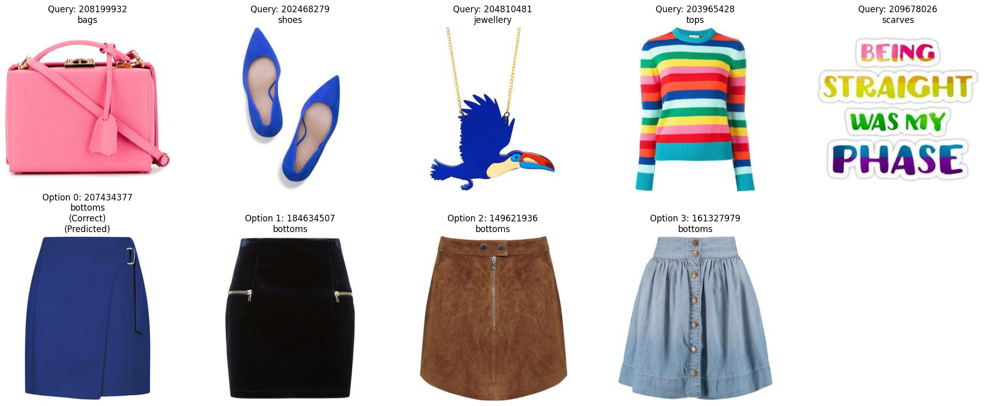

In [18]:
# Section: Visualize CIR Test Example
#
# This cell loads a CIR checkpoint, selects a random example from the test set
# (fill_in_the_blank/test.json), and prints its details with images. It shows the
# outfit (query), the 4 candidate items, the correct option (label), and the
# model's predicted option. Assumes all required functions (load_metadata,
# load_item, PolyvoreFillInTheBlankDataset, etc.) are defined.

import os
import torch
import random
import matplotlib.pyplot as plt
from PIL import Image

# Define paths
CHECKPOINT_DIR = os.path.join(os.getcwd(), 'checkpoints', 'complementary_clip')
POLYVORE_IMAGE_DATA_PATH = f"{POLYVORE_DIR}/images/{{item_id}}.jpg"

# Configuration
class CIRArgs:
    polyvore_dir = POLYVORE_DIR
    polyvore_type = 'nondisjoint'
    batch_sz_per_gpu = 32
    n_workers_per_gpu = 4
    world_size = 1

cir_args = CIRArgs()

# Load test dataset for CIR
test_cir_dataset = PolyvoreFillInTheBlankDataset(
    dataset_dir=cir_args.polyvore_dir,
    dataset_type=cir_args.polyvore_type,
    dataset_split='test',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=True  # Load images for visualization
)

# Select a random test example
example_idx = random.randint(0, len(test_cir_dataset) - 1)
example = test_cir_dataset[example_idx]

# Initialize model and load checkpoint
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
cir_model = OutfitCLIPTransformer(OutfitTransformerConfig(n_items=len(metadata))).to(device)

# Load checkpoint
checkpoint_path = os.path.join(CHECKPOINT_DIR, 'epoch_40.pth')
if not os.path.exists(checkpoint_path):
    raise FileNotFoundError(f"Checkpoint {checkpoint_path} not found. Please verify the path.")
cir_model = load_checkpoint(cir_model, checkpoint_path)

# Get model prediction for the example
cir_model.eval()
with torch.no_grad():
    queries = [example['query']]  # Single query
    candidates = [example['candidates']]  # Single group of 4 candidates
    labels = torch.tensor([example['label']], device=device)

    batched_q_emb = get_cls_embedding(cir_model, queries, device,
                                     use_precomputed_embedding=True).unsqueeze(1)
    batched_c_embs = []
    for cand_group in candidates:
        cand_embs = get_cls_embedding(cir_model, [[cand] for cand in cand_group], device,
                                     use_precomputed_embedding=True)
        batched_c_embs.append(cand_embs)
    batched_c_embs = torch.stack(batched_c_embs)  # (1, 4, d_model)

    dists = torch.norm(batched_q_emb - batched_c_embs, dim=-1)  # (1, 4)
    pred = torch.argmin(dists, dim=-1).item()  # Predicted candidate index

# Print example details
print(f"\nCIR Test Example (Index: {example_idx})")
print("Outfit (Query):")
for item in example['query']:
    print(f"- ID: {item.item_id}, Category: {item.category}")

print("\nCandidates:")
for i, candidate in enumerate(example['candidates']):
    print(f"- Option {i}: ID: {candidate.item_id}, Category: {candidate.category}")

print(f"\nCorrect Option: {example['label']} (ID: {example['candidates'][example['label']].item_id})")
print(f"Predicted Option: {pred} (ID: {example['candidates'][pred].item_id})")
print(f"Prediction Correct: {'Yes' if pred == example['label'] else 'No'}")

# Visualize images
fig, axes = plt.subplots(2, max(len(example['query']), len(example['candidates'])),
                        figsize=(4 * max(len(example['query']), len(example['candidates'])), 8))

# Plot query images (outfit)
for i, item in enumerate(example['query']):
    image = item.image
    if image is not None:
        axes[0, i].imshow(image)
        axes[0, i].set_title(f"Query: {item.item_id}\n{item.category}")
    else:
        axes[0, i].text(0.5, 0.5, "Image not available", ha='center', va='center')
    axes[0, i].axis('off')

# Plot candidate images
for i, candidate in enumerate(example['candidates']):
    image = candidate.image
    title = f"Option {i}: {candidate.item_id}\n{candidate.category}"
    if i == example['label']:
        title += "\n(Correct)"
    if i == pred:
        title += "\n(Predicted)"
    if image is not None:
        axes[1, i].imshow(image)
        axes[1, i].set_title(title)
    else:
        axes[1, i].text(0.5, 0.5, "Image not available", ha='center', va='center')
    axes[1, i].axis('off')

# Adjust layout for empty subplots
for i in range(len(example['query']), axes.shape[1]):
    axes[0, i].axis('off')
for i in range(len(example['candidates']), axes.shape[1]):
    axes[1, i].axis('off')



plt.tight_layout()
plt.show()




## Prueba CIR real

In [19]:
# Section: Train CIR with Global Validation
#
# This cell trains the Category-aware Image Retrieval (CIR) model using
# PolyvoreTripletDataset for both training and validation, predicting the
# missing item by finding the closest item in the entire embedding database.
# It initializes from a CP checkpoint (epoch_50.pth) and maintains the same
# training configuration as before.

import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from tqdm import tqdm
import matplotlib.pyplot as plt
import logging

# Define paths
CHECKPOINT_DIR = os.path.join(os.getcwd(), 'checkpoints', 'complementary_clip')
LOGS_DIR = os.path.join(os.getcwd(), 'logs')
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(LOGS_DIR, exist_ok=True)

# Logging setup
logger = logging.getLogger('complementary_clip_global')
logging.basicConfig(
    filename=os.path.join(LOGS_DIR, 'complementary_clip_global.log'),
    level=logging.INFO,
    format='%(asctime)s - %(levelname)s - %(message)s'
)

# New Functions

def find_closest_item(query_emb, embedding_dict, metadata, target_category, device):
    """Find the closest item in the embedding database for a query embedding.

    Args:
        query_emb (torch.Tensor): Query embedding, shape (d_model,).
        embedding_dict (dict): Dictionary mapping item_id to embedding (1024,).
        metadata (dict): Item metadata with category information.
        target_category (str): Category to restrict the search (e.g., 'shoes').
        device (torch.device): Device for computations.

    Returns:
        tuple: (closest_item_id, is_correct), where is_correct is True if the
               closest item matches the target item_id.
    """
    # Convert embedding_dict to tensor
    item_ids = []
    embeddings = []
    for item_id, emb in embedding_dict.items():
        if metadata[item_id]['semantic_category'] == target_category:
            item_ids.append(item_id)
            embeddings.append(emb)

    if not embeddings:
        logger.error(f"No items found for category {target_category}")
        return None, False

    embeddings = torch.from_numpy(np.array(embeddings)).to(dtype=torch.float32, device=device)  # (n_items, 1024)

    # Project embeddings to model dimension (d_model)
    embeddings = model.fc(embeddings)  # (n_items, d_model)

    # Compute distances
    query_emb = query_emb.unsqueeze(0)  # (1, d_model)
    dists = torch.norm(query_emb - embeddings, dim=-1)  # (n_items,)

    # Find closest item
    closest_idx = torch.argmin(dists).item()
    closest_item_id = item_ids[closest_idx]

    return closest_item_id

def valid_step_cir_global(args, epoch, model, dataloader, embedding_dict, metadata, device):
    """Validation step for CIR, predicting the closest item in the entire database.

    Args:
        args (CIRArgs): Training arguments.
        epoch (int): Current epoch.
        model (OutfitCLIPTransformer): Model to evaluate.
        dataloader (DataLoader): Validation DataLoader (PolyvoreTripletDataset).
        embedding_dict (dict): Dictionary of item embeddings.
        metadata (dict): Item metadata.
        device (torch.device): Device for computations.

    Returns:
        float: Validation accuracy (proportion of correct predictions).
    """
    model.eval()
    correct = 0
    total = 0
    pbar = tqdm(dataloader, desc=f'Valid CIR Epoch {epoch+1}/{args.n_epochs}')

    with torch.no_grad():
        for data in pbar:
            queries = data['query']
            answers = [[answer] for answer in data['answer']]  # Wrap answers as single-item outfits
            answer_ids = [answer.item_id for answer in data['answer']]
            answer_categories = [answer.category for answer in data['answer']]

            # Compute query embeddings
            batched_q_emb = get_cls_embedding(model, queries, device,
                                            use_precomputed_embedding=True)  # (batch_size, d_model)

            # Find closest item for each query
            for i, (q_emb, ans_id, ans_cat) in enumerate(zip(batched_q_emb, answer_ids, answer_categories)):
                closest_id = find_closest_item(q_emb, embedding_dict, metadata, ans_cat, device)
                if closest_id == ans_id:
                    correct += 1
                total += 1

            # Update progress bar
            acc = correct / total if total > 0 else 0.0
            pbar.set_postfix(acc=acc)

    accuracy = correct / total if total > 0 else 0.0
    logger.info(f'Epoch {epoch+1}/{args.n_epochs} Valid CIR --> Acc: {accuracy:.4f}')
    print(f'Epoch {epoch+1}/{args.n_epochs} Valid CIR --> Acc: {accuracy:.4f}')
    return accuracy

# Configuration
class CIRArgs:
    model_type = 'clip'
    polyvore_dir = POLYVORE_DIR
    polyvore_type = 'nondisjoint'
    batch_sz_per_gpu = 32
    n_workers_per_gpu = 4
    n_epochs = 200
    lr = 2e-5
    accumulation_steps = 4
    wandb_key = None
    seed = 42
    checkpoint = os.path.join(os.getcwd(), 'checkpoints', 'compatibility_clip', 'epoch_50.pth')
    world_size = 1
    project_name = 'complementary_clip_global'

cir_args = CIRArgs()
logger.info(f"CIR Arguments: {vars(cir_args)}")
print(f"CIR Arguments: {vars(cir_args)}")

# Set seed
seed_everything(cir_args.seed)

# Load datasets
metadata = load_metadata(cir_args.polyvore_dir)
embedding_dict = load_embedding_dict(cir_args.polyvore_dir)

train_cir_dataset = PolyvoreTripletDataset(
    dataset_dir=cir_args.polyvore_dir,
    dataset_type=cir_args.polyvore_type,
    dataset_split='train',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=False
)

valid_cir_dataset = PolyvoreTripletDataset(
    dataset_dir=cir_args.polyvore_dir,
    dataset_type=cir_args.polyvore_type,
    dataset_split='valid',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=False
)

# Create DataLoaders
train_cir_dataloader = DataLoader(
    dataset=train_cir_dataset,
    batch_size=cir_args.batch_sz_per_gpu,
    shuffle=True,
    num_workers=cir_args.n_workers_per_gpu,
    collate_fn=triplet_collate_fn
)

valid_cir_dataloader = DataLoader(
    dataset=valid_cir_dataset,
    batch_size=cir_args.batch_sz_per_gpu,
    shuffle=False,
    num_workers=cir_args.n_workers_per_gpu,
    collate_fn=triplet_collate_fn
)

# Initialize model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = OutfitCLIPTransformer(OutfitCLIPTransformerConfig(n_items=len(metadata))).to(device)

# Load CP checkpoint from epoch 50
if not os.path.exists(cir_args.checkpoint):
    raise FileNotFoundError(f"Checkpoint {cir_args.checkpoint} not found. Please verify the path.")
model = load_checkpoint(model, cir_args.checkpoint)
logger.info(f"Loaded CP checkpoint from {cir_args.checkpoint}")

# Optimizer, scheduler, loss
optimizer = optim.AdamW(model.parameters(), lr=cir_args.lr)
scheduler = optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=cir_args.lr,
    epochs=cir_args.n_epochs,
    steps_per_epoch=int(len(train_cir_dataloader) / cir_args.accumulation_steps),
    pct_start=0.3,
    anneal_strategy='cos',
    div_factor=25,
    final_div_factor=1e4
)
loss_fn = InBatchTripletMarginLoss(margin=2.0, reduction='mean')
"""

# Training loop
train_losses, train_accs, valid_accs = [], [], []
for epoch in range(cir_args.n_epochs):
    # Training
    model.train()
    train_loss, all_preds, all_labels = 0.0, [], []
    pbar = tqdm(train_cir_dataloader, desc=f'Train CIR Epoch {epoch+1}/{cir_args.n_epochs}')
    for i, data in enumerate(pbar):
        queries = data['query']
        answers = [[answer] for answer in data['answer']]

        batched_q_emb = get_cls_embedding(model, queries, device, use_precomputed_embedding=True)
        batched_a_emb = get_cls_embedding(model, answers, device, use_precomputed_embedding=True)

        loss = loss_fn(batched_q_emb, batched_a_emb) / cir_args.accumulation_steps
        loss.backward()

        if (i + 1) % cir_args.accumulation_steps == 0:
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()
            optimizer.zero_grad()
            scheduler.step()

        train_loss += loss.item() * cir_args.accumulation_steps

        dists = torch.cdist(batched_q_emb, batched_a_emb, p=2)
        preds = torch.argmin(dists, dim=1)
        labels = torch.arange(len(preds), device=device)

        all_preds.append(preds.detach())
        all_labels.append(labels.detach())

        score = compute_cir_scores(preds, labels)
        pbar.set_postfix(loss=loss.item() * cir_args.accumulation_steps, acc=score['acc'])

    train_loss /= len(train_cir_dataloader)
    all_preds = torch.cat(all_preds)
    all_labels = torch.cat(all_labels)
    train_scores = compute_cir_scores(all_preds, all_labels)
    train_losses.append(train_loss)
    train_accs.append(train_scores['acc'])
    logger.info(f'Epoch {epoch+1}/{cir_args.n_epochs} Train CIR --> Loss: {train_loss:.4f}, '
               f'Acc: {train_scores["acc"]:.4f}')
    print(f'Epoch {epoch+1}/{cir_args.n_epochs} Train CIR --> Loss: {train_loss:.4f}, '
          f'Acc: {train_scores["acc"]:.4f}')

    # Validation
    valid_acc = valid_step_cir_global(cir_args, epoch, model, valid_cir_dataloader,
                                     embedding_dict, metadata, device)
    valid_accs.append(valid_acc)

    # Save checkpoint
    checkpoint_path = os.path.join(CHECKPOINT_DIR, f'epoch_{epoch+1}.pth')
    torch.save({'config': model.cfg.__dict__, 'model': model.state_dict()}, checkpoint_path)
    logger.info(f'Checkpoint saved at {checkpoint_path}')
    print(f'Checkpoint saved at {checkpoint_path}')

# Plot training curves
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Train Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('CIR Training Loss')
plt.subplot(1, 2, 2)
plt.plot(train_accs, label='Train Acc')
plt.plot(valid_accs, label='Valid Acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.title('CIR Training and Validation Accuracy')
plt.tight_layout()
plt.show()
"""

CIR Arguments: {}
Loaded 251008 metadata entries
Loaded 251008 embeddings into dictionary
train CIR triplet dataset: 53306 sets
valid CIR triplet dataset: 5000 sets


/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl

'\n\n# Training loop\ntrain_losses, train_accs, valid_accs = [], [], []\nfor epoch in range(cir_args.n_epochs):\n    # Training\n    model.train()\n    train_loss, all_preds, all_labels = 0.0, [], []\n    pbar = tqdm(train_cir_dataloader, desc=f\'Train CIR Epoch {epoch+1}/{cir_args.n_epochs}\')\n    for i, data in enumerate(pbar):\n        queries = data[\'query\']\n        answers = [[answer] for answer in data[\'answer\']]\n\n        batched_q_emb = get_cls_embedding(model, queries, device, use_precomputed_embedding=True)\n        batched_a_emb = get_cls_embedding(model, answers, device, use_precomputed_embedding=True)\n\n        loss = loss_fn(batched_q_emb, batched_a_emb) / cir_args.accumulation_steps\n        loss.backward()\n\n        if (i + 1) % cir_args.accumulation_steps == 0:\n            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)\n            optimizer.step()\n            optimizer.zero_grad()\n            scheduler.step()\n\n        train_loss += loss.item(

## Prueba de CIR

valid CIR triplet dataset: 5000 sets

CIR Test Example (Index: 912)
Outfit (Query):
- ID: 214032163, Category: jewellery
- ID: 214855321, Category: all-body

Correct Item (Answer):
- ID: 214922859, Category: jewellery

Top 10 Predicted Items:
- Rank 1: ID: 166381925, Category: jewellery, Distance: 10.2971, Correct: No
- Rank 2: ID: 197286658, Category: jewellery, Distance: 10.2980, Correct: No
- Rank 3: ID: 150158127, Category: jewellery, Distance: 10.3062, Correct: No
- Rank 4: ID: 213367466, Category: jewellery, Distance: 10.3070, Correct: No
- Rank 5: ID: 138615168, Category: jewellery, Distance: 10.3074, Correct: No
- Rank 6: ID: 184092146, Category: jewellery, Distance: 10.3086, Correct: No
- Rank 7: ID: 166195133, Category: jewellery, Distance: 10.3112, Correct: No
- Rank 8: ID: 162074049, Category: jewellery, Distance: 10.3115, Correct: No
- Rank 9: ID: 148445574, Category: jewellery, Distance: 10.3121, Correct: No
- Rank 10: ID: 137644883, Category: jewellery, Distance: 10.3130

/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl

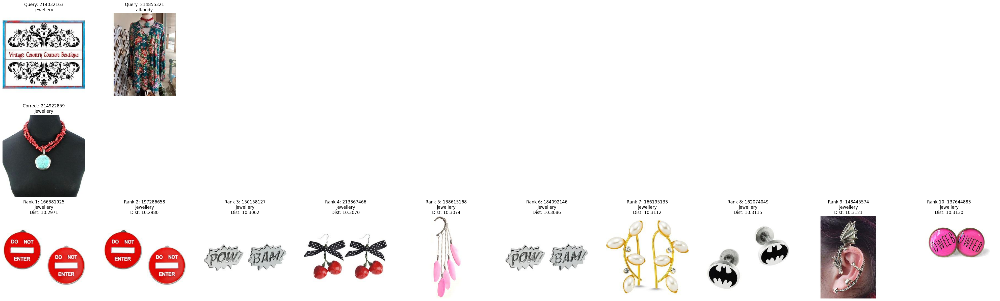

In [20]:
# Section: Visualize CIR Test Example with Top 10 Predictions
#
# This cell loads a CIR checkpoint (epoch_154.pth), selects a random example
# from the test set (valid.json using PolyvoreTripletDataset), and displays:
# - The outfit (query).
# - The correct item to predict (answer).
# - The top 10 predicted items from the entire embedding database, restricted
# to the same category as the answer. Assumes all required functions are defined.

import os
import torch
import random
import matplotlib.pyplot as plt
import numpy as np

# Define paths
CHECKPOINT_DIR = os.path.join(os.getcwd(), 'checkpoints', 'complementary_clip')
POLYVORE_IMAGE_DATA_PATH = f"{POLYVORE_DIR}/images/{{item_id}}.jpg"

# New function to find top k closest items
def find_top_k_items(query_emb, embedding_dict, metadata, target_category, device, k=10):
    """Find the top k closest items in the embedding database for a query embedding.

    Args:
        query_emb (torch.Tensor): Query embedding, shape (d_model,).
        embedding_dict (dict): Dictionary mapping item_id to embedding (1024,).
        metadata (dict): Item metadata with category information.
        target_category (str): Category to restrict the search (e.g., 'shoes').
        device (torch.device): Device for computations.
        k (int): Number of top items to return (default: 10).

    Returns:
        list: List of (item_id, distance) tuples for the top k closest items.
    """
    # Filter items by category
    item_ids = []
    embeddings = []
    for item_id, emb in embedding_dict.items():
        if metadata[item_id]['semantic_category'] == target_category:
            item_ids.append(item_id)
            embeddings.append(emb)

    if not embeddings:
        print(f"No items found for category {target_category}")
        return []

    # Convert to tensor
    embeddings = torch.from_numpy(np.array(embeddings)).to(dtype=torch.float32, device=device)  # (n_items, 1024)

    # Project embeddings to model dimension
    embeddings = model.fc(embeddings)  # (n_items, d_model)

    # Compute distances
    query_emb = query_emb.unsqueeze(0)  # (1, d_model)
    dists = torch.norm(query_emb - embeddings, dim=-1)  # (n_items,)

    # Get top k indices and distances
    top_k_dists, top_k_indices = torch.topk(dists, k=k, largest=False)
    top_k_items = [(item_ids[idx], dist.item()) for idx, dist in zip(top_k_indices, top_k_dists)]

    return top_k_items

# Load test dataset (using valid.json as in your training)
test_cir_dataset = PolyvoreTripletDataset(
    dataset_dir=POLYVORE_DIR,
    dataset_type='nondisjoint',
    dataset_split='valid',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=True  # Load images for visualization
)

# Select a random test example
example_idx = random.randint(0, len(test_cir_dataset) - 1)
example = test_cir_dataset[example_idx]

# Initialize model and load checkpoint
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = OutfitCLIPTransformer(OutfitTransformerConfig(n_items=len(metadata))).to(device)

# Load checkpoint
checkpoint_path = os.path.join(CHECKPOINT_DIR, 'epoch_40.pth')
if not os.path.exists(checkpoint_path):
    raise FileNotFoundError(f"Checkpoint {checkpoint_path} not found. Please verify the path.")
model = load_checkpoint(model, checkpoint_path)

# Get model predictions for the example
model.eval()
with torch.no_grad():
    queries = [example['query']]  # Single query
    answer = example['answer']
    answer_id = answer.item_id
    answer_category = answer.category

    # Compute query embedding
    query_emb = get_cls_embedding(model, queries, device,
                                use_precomputed_embedding=True)[0]  # (d_model,)

    # Find top 10 closest items
    top_k_items = find_top_k_items(query_emb, embedding_dict, metadata, answer_category, device, k=10)

# Load images for top k items
top_k_items_with_images = []
for item_id, dist in top_k_items:
    item = load_item(POLYVORE_DIR, metadata, item_id, should_load_image=True, embedding_dict=embedding_dict)
    top_k_items_with_images.append((item, dist))

# Print example details
print(f"\nCIR Test Example (Index: {example_idx})")
print("Outfit (Query):")
for item in example['query']:
    print(f"- ID: {item.item_id}, Category: {item.category}")

print("\nCorrect Item (Answer):")
print(f"- ID: {answer_id}, Category: {answer_category}")

print("\nTop 10 Predicted Items:")
for i, (item, dist) in enumerate(top_k_items_with_images):
    is_correct = item.item_id == answer_id
    print(f"- Rank {i+1}: ID: {item.item_id}, Category: {item.category}, Distance: {dist:.4f}, Correct: {'Yes' if is_correct else 'No'}")

# Visualize images
n_query = len(example['query'])
n_top_k = len(top_k_items_with_images)
fig, axes = plt.subplots(3, max(n_query, n_top_k), figsize=(4 * max(n_query, n_top_k), 12))

# Plot query images (outfit)
for i, item in enumerate(example['query']):
    image = item.image
    if image is not None:
        axes[0, i].imshow(image)
        axes[0, i].set_title(f"Query: {item.item_id}\n{item.category}")
    else:
        axes[0, i].text(0.5, 0.5, "Image not available", ha='center', va='center')
    axes[0, i].axis('off')

# Plot correct item (answer)
image = answer.image
if image is not None:
    axes[1, 0].imshow(image)
    axes[1, 0].set_title(f"Correct: {answer_id}\n{answer_category}")
else:
    axes[1, 0].text(0.5, 0.5, "Image not available", ha='center', va='center')
axes[1, 0].axis('off')

# Disable extra axes in correct item row
for i in range(1, max(n_query, n_top_k)):
    axes[1, i].axis('off')

# Plot top k predicted items
for i, (item, dist) in enumerate(top_k_items_with_images):
    image = item.image
    is_correct = item.item_id == answer_id
    title = f"Rank {i+1}: {item.item_id}\n{item.category}\nDist: {dist:.4f}"
    if is_correct:
        title += "\n(Correct)"
    if image is not None:
        axes[2, i].imshow(image)
        axes[2, i].set_title(title)
    else:
        axes[2, i].text(0.5, 0.5, "Image not available", ha='center', va='center')
    axes[2, i].axis('off')

# Disable extra axes
for i in range(n_query, max(n_query, n_top_k)):
    axes[0, i].axis('off')
for i in range(n_top_k, max(n_query, n_top_k)):
    axes[2, i].axis('off')

plt.tight_layout()
plt.show()

valid CIR triplet dataset: 5000 sets

CIR Test Example (Index: 2253)
Outfit (Query):
- ID: 204805640, Category: bags
- ID: 193334231, Category: tops
- ID: 207927262, Category: jewellery
- ID: 204816439, Category: bottoms
- ID: 208635655, Category: outerwear

Correct Item (Answer):
- ID: 208785822, Category: shoes

Top 10 Predicted Items:
- Rank 1: ID: 206492368, Category: shoes, Distance: 10.3012, Correct: No
- Rank 2: ID: 158543751, Category: shoes, Distance: 10.3087, Correct: No
- Rank 3: ID: 45966001, Category: shoes, Distance: 10.3088, Correct: No
- Rank 4: ID: 193441738, Category: shoes, Distance: 10.3099, Correct: No
- Rank 5: ID: 137058092, Category: shoes, Distance: 10.3110, Correct: No
- Rank 6: ID: 189791365, Category: shoes, Distance: 10.3113, Correct: No
- Rank 7: ID: 202750557, Category: shoes, Distance: 10.3123, Correct: No
- Rank 8: ID: 155830174, Category: shoes, Distance: 10.3127, Correct: No
- Rank 9: ID: 210637541, Category: shoes, Distance: 10.3133, Correct: No
- Ra

/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl

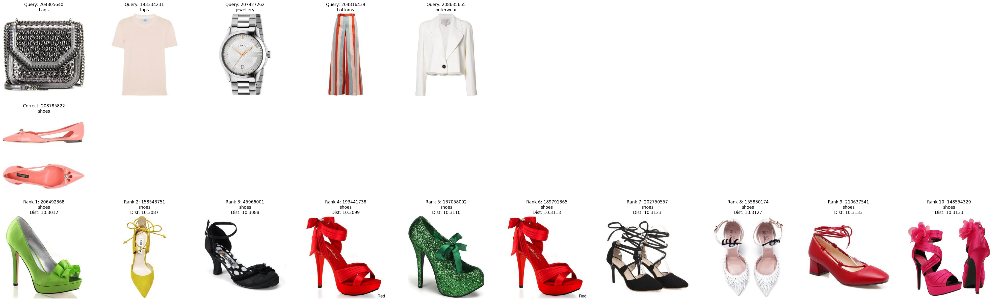

In [21]:
# Section: Visualize CIR Test Example with Top 10 Predictions
#
# This cell loads a CIR checkpoint (epoch_154.pth), selects a random example
# from the test set (valid.json using PolyvoreTripletDataset), and displays:
# - The outfit (query).
# - The correct item to predict (answer).
# - The top 10 predicted items from the entire embedding database, restricted
# to the same category as the answer. Assumes all required functions are defined.

import os
import torch
import random
import matplotlib.pyplot as plt
import numpy as np

# Define paths
CHECKPOINT_DIR = os.path.join(os.getcwd(), 'checkpoints', 'complementary_clip')
POLYVORE_IMAGE_DATA_PATH = f"{POLYVORE_DIR}/images/{{item_id}}.jpg"

# New function to find top k closest items
def find_top_k_items(query_emb, embedding_dict, metadata, target_category, device, k=10):
    """Find the top k closest items in the embedding database for a query embedding.

    Args:
        query_emb (torch.Tensor): Query embedding, shape (d_model,).
        embedding_dict (dict): Dictionary mapping item_id to embedding (1024,).
        metadata (dict): Item metadata with category information.
        target_category (str): Category to restrict the search (e.g., 'shoes').
        device (torch.device): Device for computations.
        k (int): Number of top items to return (default: 10).

    Returns:
        list: List of (item_id, distance) tuples for the top k closest items.
    """
    # Filter items by category
    item_ids = []
    embeddings = []
    for item_id, emb in embedding_dict.items():
        if metadata[item_id]['semantic_category'] == target_category:
            item_ids.append(item_id)
            embeddings.append(emb)

    if not embeddings:
        print(f"No items found for category {target_category}")
        return []

    # Convert to tensor
    embeddings = torch.from_numpy(np.array(embeddings)).to(dtype=torch.float32, device=device)  # (n_items, 1024)

    # Project embeddings to model dimension
    embeddings = model.fc(embeddings)  # (n_items, d_model)

    # Compute distances
    query_emb = query_emb.unsqueeze(0)  # (1, d_model)
    dists = torch.norm(query_emb - embeddings, dim=-1)  # (n_items,)

    # Get top k indices and distances
    top_k_dists, top_k_indices = torch.topk(dists, k=k, largest=False)
    top_k_items = [(item_ids[idx], dist.item()) for idx, dist in zip(top_k_indices, top_k_dists)]

    return top_k_items

# Load test dataset (using valid.json as in your training)
test_cir_dataset = PolyvoreTripletDataset(
    dataset_dir=POLYVORE_DIR,
    dataset_type='nondisjoint',
    dataset_split='valid',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=True  # Load images for visualization
)

# Select a random test example
example_idx = random.randint(0, len(test_cir_dataset) - 1)
example = test_cir_dataset[example_idx]

# Initialize model and load checkpoint
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = OutfitCLIPTransformer(OutfitTransformerConfig(n_items=len(metadata))).to(device)

# Load checkpoint
checkpoint_path = os.path.join(CHECKPOINT_DIR, 'epoch_40.pth')
if not os.path.exists(checkpoint_path):
    raise FileNotFoundError(f"Checkpoint {checkpoint_path} not found. Please verify the path.")
model = load_checkpoint(model, checkpoint_path)

# Get model predictions for the example
model.eval()
with torch.no_grad():
    queries = [example['query']]  # Single query
    answer = example['answer']
    answer_id = answer.item_id
    answer_category = answer.category

    # Compute query embedding
    query_emb = get_cls_embedding(model, queries, device,
                                use_precomputed_embedding=True)[0]  # (d_model,)

    # Find top 10 closest items
    top_k_items = find_top_k_items(query_emb, embedding_dict, metadata, answer_category, device, k=10)

# Load images for top k items
top_k_items_with_images = []
for item_id, dist in top_k_items:
    item = load_item(POLYVORE_DIR, metadata, item_id, should_load_image=True, embedding_dict=embedding_dict)
    top_k_items_with_images.append((item, dist))

# Print example details
print(f"\nCIR Test Example (Index: {example_idx})")
print("Outfit (Query):")
for item in example['query']:
    print(f"- ID: {item.item_id}, Category: {item.category}")

print("\nCorrect Item (Answer):")
print(f"- ID: {answer_id}, Category: {answer_category}")

print("\nTop 10 Predicted Items:")
for i, (item, dist) in enumerate(top_k_items_with_images):
    is_correct = item.item_id == answer_id
    print(f"- Rank {i+1}: ID: {item.item_id}, Category: {item.category}, Distance: {dist:.4f}, Correct: {'Yes' if is_correct else 'No'}")

# Visualize images
n_query = len(example['query'])
n_top_k = len(top_k_items_with_images)
fig, axes = plt.subplots(3, max(n_query, n_top_k), figsize=(4 * max(n_query, n_top_k), 12))

# Plot query images (outfit)
for i, item in enumerate(example['query']):
    image = item.image
    if image is not None:
        axes[0, i].imshow(image)
        axes[0, i].set_title(f"Query: {item.item_id}\n{item.category}")
    else:
        axes[0, i].text(0.5, 0.5, "Image not available", ha='center', va='center')
    axes[0, i].axis('off')

# Plot correct item (answer)
image = answer.image
if image is not None:
    axes[1, 0].imshow(image)
    axes[1, 0].set_title(f"Correct: {answer_id}\n{answer_category}")
else:
    axes[1, 0].text(0.5, 0.5, "Image not available", ha='center', va='center')
axes[1, 0].axis('off')

# Disable extra axes in correct item row
for i in range(1, max(n_query, n_top_k)):
    axes[1, i].axis('off')

# Plot top k predicted items
for i, (item, dist) in enumerate(top_k_items_with_images):
    image = item.image
    is_correct = item.item_id == answer_id
    title = f"Rank {i+1}: {item.item_id}\n{item.category}\nDist: {dist:.4f}"
    if is_correct:
        title += "\n(Correct)"
    if image is not None:
        axes[2, i].imshow(image)
        axes[2, i].set_title(title)
    else:
        axes[2, i].text(0.5, 0.5, "Image not available", ha='center', va='center')
    axes[2, i].axis('off')

# Disable extra axes
for i in range(n_query, max(n_query, n_top_k)):
    axes[0, i].axis('off')
for i in range(n_top_k, max(n_query, n_top_k)):
    axes[2, i].axis('off')



plt.tight_layout()
plt.show()

# Visualize embeddings

In [ ]:
!pip install --quiet umap-learn plotly scikit-learn nbformat

In [ ]:
import pickle
import numpy as np
import pandas as pd

# Dimensionality reduction and plotting
import umap
import plotly.express as px

# 1. Load your precomputed CLIP embeddings
with open("datasets/polyvore/precomputed_clip_embeddings/polyvore_0.pkl", "rb") as f:
    data = pickle.load(f)

# Assume `data` is a dict with keys 'embeddings' and 'item_ids' (or adjust to match your structure)
embeddings = np.array(data['embeddings'])  # shape: (N, D)
labels = data.get('item_ids', list(range(len(embeddings))))
# If you have image paths in your data, e.g.:
image_paths = data.get('image_paths', None)

# 2. Project embeddings into 2D space using UMAP
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    metric='cosine',
    random_state=42
)
emb_2d = reducer.fit_transform(embeddings)

# 3. Build a DataFrame for Plotly
df = pd.DataFrame({
    'x': emb_2d[:, 0],
    'y': emb_2d[:, 1],
    'label': labels
})
if image_paths is not None:
    df['image'] = image_paths

# 4. Create an interactive scatter plot
if image_paths is not None:
    fig = px.scatter(
        df, x='x', y='y',
        hover_name='label',
        hover_data=['image'],
        title='CLIP Embeddings UMAP Projection'
    )
else:
    fig = px.scatter(
        df, x='x', y='y',
        hover_name='label',
        title='CLIP Embeddings UMAP Projection'
    )

fig.update_traces(marker=dict(size=6, opacity=0.7))
fig.update_layout(width=800, height=600)
fig.show()  # In Colab, this will render the interactive chart

# Optional: for t-SNE instead of UMAP
# from sklearn.manifold import TSNE
# tsne = TSNE(n_components=2, perplexity=30, random_state=42)\# emb_tsne = tsne.fit_transform(embeddings)


/home/ia/Documentos/TFG_Lara/TFG/outfit-transformer-venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/ia/Documentos/TFG_Lara/TFG/outfit-transformer-venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [ ]:


import pickle
import numpy as np
import pandas as pd

# Dimensionality reduction and interactive plotting
import umap
import plotly.express as px
from plotly.offline import init_notebook_mode

# Enable Plotly in the notebook
init_notebook_mode(connected=True)

# 1. Load your precomputed CLIP embeddings
with open("datasets/polyvore/precomputed_clip_embeddings/polyvore_0.pkl", "rb") as f:
    data = pickle.load(f)

# Adjust keys to your data structure
embeddings = np.array(data.get('embeddings', data.get('clip_embeddings')))
labels = data.get('item_ids', list(range(len(embeddings))))
image_paths = data.get('image_paths', None)

# Subsample the data to avoid memory issues
N = 2000
if embeddings.shape[0] > N:
    idx = np.random.choice(len(embeddings), size=N, replace=False)
    embeddings = embeddings[idx]
    labels = [labels[i] for i in idx]
    if image_paths is not None:
        image_paths = [image_paths[i] for i in idx]

# 2. Project embeddings into 2D using UMAP
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    metric='cosine',
    random_state=42
)
emb_2d = reducer.fit_transform(embeddings)

# 3. Prepare DataFrame for plotting
df = pd.DataFrame({
    'x': emb_2d[:, 0],
    'y': emb_2d[:, 1],
    'label': labels
})
if image_paths is not None:
    df['image'] = image_paths

# 4. Create and display interactive scatter plot
fig = px.scatter(
    df,
    x='x',
    y='y',
    hover_name='label',
    hover_data=['image'] if image_paths is not None else None,
    title='CLIP Embeddings UMAP Projection',
    width=800,
    height=600
)
fig.update_traces(marker=dict(size=6, opacity=0.7))
fig.show()

# Notes:
# • Re-run the pip install cell if you restart your Colab runtime.
# • Tweak `n_neighbors` and `min_dist` for different cluster granularity.
# • For t-SNE, uncomment the following block:
#
# from sklearn.manifold import TSNE
# tsne = TSNE(n_components=2, perplexity=30, random_state=42)
# emb_tsne = tsne.fit_transform(embeddings)
# df[['x', 'y']] = emb_tsne
# fig.data[0].x = emb_tsne[:, 0]
# fig.data[0].y = emb_tsne[:, 1]
# fig.update_layout(title='CLIP Embeddings t-SNE Projection')
# fig.show()

/home/ia/Documentos/TFG_Lara/TFG/outfit-transformer-venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/ia/Documentos/TFG_Lara/TFG/outfit-transformer-venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [ ]:
import pickle
import numpy as np
import pandas as pd

# Dimensionality reduction and interactive plotting
import umap
import plotly.express as px
import plotly.io as pio

# Explicit renderer setup for Colab
pio.renderers.default = 'colab'  # fallback options: 'iframe', 'svg', 'colab'

# 1. Load your precomputed CLIP embeddings
with open("datasets/polyvore/precomputed_clip_embeddings/polyvore_0.pkl", "rb") as f:
    data = pickle.load(f)

# Adjust keys to your data structure
embeddings = np.array(data.get('embeddings', data.get('clip_embeddings')))
labels = data.get('item_ids', list(range(len(embeddings))))
image_paths = data.get('image_paths', None)

# Subsample the data to avoid memory issues
N = 2000
if embeddings.shape[0] > N:
    idx = np.random.choice(len(embeddings), size=N, replace=False)
    embeddings = embeddings[idx]
    labels = [labels[i] for i in idx]
    if image_paths is not None:
        image_paths = [image_paths[i] for i in idx]

# 2. Project embeddings into 2D using UMAP
reducer = umap.UMAP(
    n_neighbors=15,
    min_dist=0.1,
    metric='cosine',
    random_state=42
)
emb_2d = reducer.fit_transform(embeddings)

# 3. Prepare DataFrame for plotting
df = pd.DataFrame({
    'x': emb_2d[:, 0],
    'y': emb_2d[:, 1],
    'label': labels
})
if image_paths is not None:
    df['image'] = image_paths

# 4. Create and display interactive scatter plot
fig = px.scatter(
    df,
    x='x',
    y='y',
    hover_name='label',
    hover_data=['image'] if image_paths is not None else None,
    title='CLIP Embeddings UMAP Projection',
    width=800,
    height=600
)
fig.update_traces(marker=dict(size=6, opacity=0.7))
pio.show(fig)  # explicitly display using plotly.io

# Notes:
# • Re-run the pip install cell if you restart your Colab runtime.
# • Tweak `n_neighbors` and `min_dist` for different cluster granularity.
# • For t-SNE, uncomment the following block:
#
# from sklearn.manifold import TSNE
# tsne = TSNE(n_components=2, perplexity=30, random_state=42)
# emb_tsne = tsne.fit_transform(embeddings)
# df[['x', 'y']] = emb_tsne
# fig.data[0].x = emb_tsne[:, 0]
# fig.data[0].y = emb_tsne[:, 1]
# fig.update_layout(title='CLIP Embeddings t-SNE Projection')
# pio.show(fig)


/home/ia/Documentos/TFG_Lara/TFG/outfit-transformer-venv/lib/python3.12/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/home/ia/Documentos/TFG_Lara/TFG/outfit-transformer-venv/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



# NUEVO: FITB con CP

test CIR FITB dataset: 10000 outfits, Label distribution: Counter({0: 10000})
Predicted probabilities: tensor([0.6942, 0.5479, 0.5450, 0.6973], device='cuda:0')

CP Test Example (Index: 3657)
Outfit (Query):
- ID: 183698305, Category: shoes
- ID: 181874123, Category: hats
- ID: 205134950, Category: tops
- ID: 169965794, Category: bottoms

Candidates:
- Option 0: ID: 186842429, Category: bags
- Option 1: ID: 159185404, Category: bags
- Option 2: ID: 202933214, Category: bags
- Option 3: ID: 213490998, Category: bags

Correct Option: 0 (ID: 186842429)
Predicted Option: 3 (ID: 213490998)
Prediction Correct: No


/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl

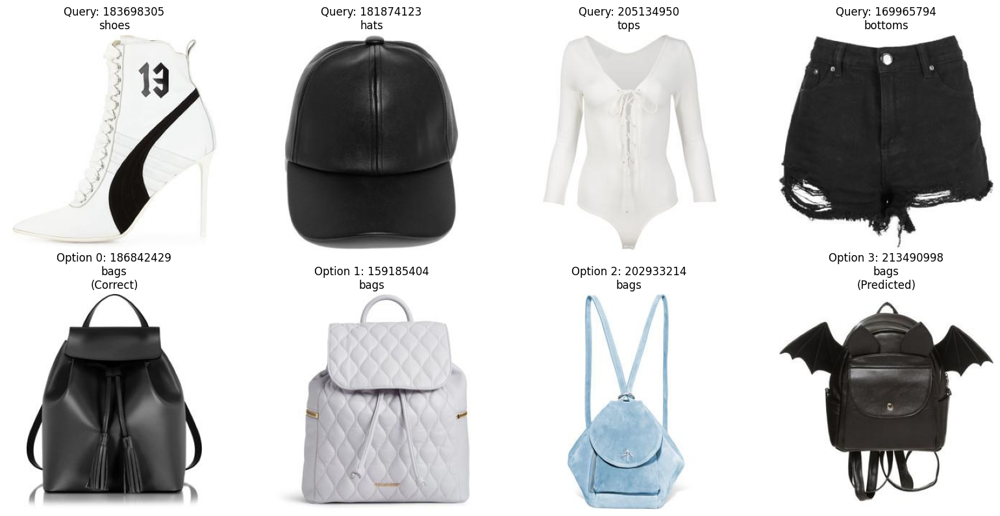

In [22]:
# -----------------------------------------------------------
# Section: Visualize CP Test Example (Fill‑in‑the‑Blank task)
#
# This cell does exactly the same thing you were doing with the
# Complementary‑Image‑Retrieval (CIR) model, but now the prediction
# is produced by the Compatibility‑Prediction (CP) model.
#
# Assumes:
#   • PolyvoreFillInTheBlankDataset, load_metadata, load_item,
#     load_checkpoint, OutfitCLIPTransformer, OutfitTransformerConfig,
#     and get_cls_embedding are already defined/imported earlier.
#   • You have a CP checkpoint in checkpoints/compatibility_clip
#     (adjust epoch number if needed).
# -----------------------------------------------------------

import os
import torch
import random
import matplotlib.pyplot as plt
from PIL import Image

# ------------------------------------------------------------------
# 1. Paths & constant definitions
# ------------------------------------------------------------------
CP_CHECKPOINT_DIR = os.path.join(os.getcwd(), 'checkpoints', 'compatibility_clip')
CP_CKPT_PATH = os.path.join(CP_CHECKPOINT_DIR, 'epoch_50.pth')  # ← adjust if different
POLYVORE_IMAGE_DATA_PATH = f"{POLYVORE_DIR}/images/{{item_id}}.jpg"


# ------------------------------------------------------------------
# 2. Mini‑config class (mirrors the earlier CIRArgs style)
# ------------------------------------------------------------------
class CPArgs:
    polyvore_dir = POLYVORE_DIR
    polyvore_type = 'nondisjoint'
    batch_sz_per_gpu = 32
    n_workers_per_gpu = 4
    world_size = 1

cp_args = CPArgs()

# ------------------------------------------------------------------
# 3. Load the FITB test split (same dataset you used for CIR)
# ------------------------------------------------------------------
test_cp_dataset = PolyvoreFillInTheBlankDataset(
    dataset_dir=cp_args.polyvore_dir,
    dataset_type=cp_args.polyvore_type,
    dataset_split='test',
    metadata=metadata,
    embedding_dict=embedding_dict,
    load_image=True            # so we can visualise the images
)

# Pick a random FITB example
example_idx = random.randint(0, len(test_cp_dataset) - 1)
example = test_cp_dataset[example_idx]

# ------------------------------------------------------------------
# 4. Instantiate CP model and load its checkpoint
# ------------------------------------------------------------------
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Same backbone – but this checkpoint was trained with a
# classification head for compatibility prediction
cp_model = OutfitCLIPTransformer(
    OutfitTransformerConfig(n_items=len(metadata))
).to(device)

if not os.path.exists(CP_CKPT_PATH):
    raise FileNotFoundError(
        f"CP checkpoint {CP_CKPT_PATH} not found. Adjust the path or epoch number."
    )
cp_model = load_checkpoint(cp_model, CP_CKPT_PATH)

# ------------------------------------------------------------------
# 5. Run CP prediction for the four candidate completions
# ------------------------------------------------------------------
cp_model.eval()
with torch.no_grad():
    # Build four complete outfits: query + each candidate
    candidate_outfits = [example['query'] + [cand] for cand in example['candidates']]

    # Forward pass through CP model (returns logits, one per outfit)
    logits = cp_model(candidate_outfits, use_precomputed_embedding=True)  # shape (4,)
    preds = torch.sigmoid(logits).squeeze()  # convert to probabilities in [0,1]
    print(f"Predicted probabilities: {preds}")
    pred_idx = torch.argmax(preds).item()    # index of best‑scoring candidate

# ------------------------------------------------------------------
# 6. Print textual summary
# ------------------------------------------------------------------
print(f"\nCP Test Example (Index: {example_idx})")
print("Outfit (Query):")
for item in example['query']:
    print(f"- ID: {item.item_id}, Category: {item.category}")

print("\nCandidates:")
for i, candidate in enumerate(example['candidates']):
    print(f"- Option {i}: ID: {candidate.item_id}, Category: {candidate.category}")

print(f"\nCorrect Option: {example['label']} "
      f"(ID: {example['candidates'][example['label']].item_id})")
print(f"Predicted Option: {pred_idx} "
      f"(ID: {example['candidates'][pred_idx].item_id})")
print(f"Prediction Correct: {'Yes' if pred_idx == example['label'] else 'No'}")

# ------------------------------------------------------------------
# 7. Visualise images (query on first row, candidates on second)
# ------------------------------------------------------------------
n_cols = max(len(example['query']), len(example['candidates']))
fig, axes = plt.subplots(2, n_cols, figsize=(4 * n_cols, 8))

# Query images
for i, item in enumerate(example['query']):
    if item.image is not None:
        axes[0, i].imshow(item.image)
        axes[0, i].set_title(f"Query: {item.item_id}\n{item.category}")
    else:
        axes[0, i].text(0.5, 0.5, "Image not available", ha='center', va='center')
    axes[0, i].axis('off')

# Candidate images
for i, candidate in enumerate(example['candidates']):
    title = f"Option {i}: {candidate.item_id}\n{candidate.category}"
    if i == example['label']:
        title += "\n(Correct)"
    if i == pred_idx:
        title += "\n(Predicted)"
    if candidate.image is not None:
        axes[1, i].imshow(candidate.image)
        axes[1, i].set_title(title)
    else:
        axes[1, i].text(0.5, 0.5, "Image not available", ha='center', va='center')
    axes[1, i].axis('off')

# Clean up any empty subplots
for i in range(len(example['query']), n_cols):
    axes[0, i].axis('off')
for i in range(len(example['candidates']), n_cols):
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()


## Calcular accuracy

In [23]:
# ------------------------------------------------------------------
# Utility: collate fn for FITB (same one you used for CIR)
# ------------------------------------------------------------------
def fitb_collate_fn(batch):
    """Return dict with keys: query, candidates, label."""
    return {
        "query":      [sample["query"]      for sample in batch],     # list[list[FashionItem]]
        "candidates": [sample["candidates"] for sample in batch],     # list[list[list[FashionItem]]]
        "label":      [sample["label"]      for sample in batch],     # list[int]
    }

# ------------------------------------------------------------------
# DataLoader (test split of Fill‑in‑the‑Blank task)
# ------------------------------------------------------------------
from torch.utils.data import DataLoader

test_fitb_loader = DataLoader(
    PolyvoreFillInTheBlankDataset(
        dataset_dir=cp_args.polyvore_dir,
        dataset_type=cp_args.polyvore_type,
        dataset_split="test",
        metadata=metadata,
        embedding_dict=embedding_dict,
        load_image=False      # no images needed for evaluation
    ),
    batch_size=16,
    shuffle=False,
    num_workers=2,
    collate_fn=fitb_collate_fn
)

# ------------------------------------------------------------------
# Evaluation loop: CP model on FITB
# ------------------------------------------------------------------
def evaluate_cp_fitb(model: torch.nn.Module,
                     dataloader: DataLoader,
                     device: torch.device) -> float:
    """
    Compute FITB accuracy with a Compatibility‑Prediction model.

    Args
    ----
    model : OutfitCLIPTransformer (trained for CP)
    dataloader : yields dict(query, candidates, label)
    device : cpu / cuda

    Returns
    -------
    accuracy (float in [0,1])
    """
    model.eval()
    correct, total = 0, 0

    with torch.no_grad():
        for batch in dataloader:
            queries     = batch["query"]          # len = B
            cand_groups = batch["candidates"]     # len = B, each 4 cands
            labels      = torch.tensor(batch["label"], device=device)  # (B,)

            # Build B×4 complete outfits: query + each candidate
            flat_outfits = []
            for q, cands in zip(queries, cand_groups):
                for cand in cands:                       # 4 items
                    flat_outfits.append(q + [cand])      # full outfit

            # Forward pass on the flattened list
            # shape: (B*4,)  → reshape to (B,4)
            logits = model(flat_outfits, use_precomputed_embedding=True).view(len(queries), 4)

            # Highest logit = most compatible outfit
            preds = torch.argmax(logits, dim=1)          # (B,)
            correct += (preds == labels).sum().item()
            total   += labels.size(0)

    return correct / total

# ------------------------------------------------------------------
# Run and report
# ------------------------------------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
fitb_acc = evaluate_cp_fitb(cp_model, test_fitb_loader, device)
print(f"CP model FITB accuracy: {fitb_acc * 100:.2f}%")


test CIR FITB dataset: 10000 outfits, Label distribution: Counter({0: 10000})
CP model FITB accuracy: 60.50%


## Fine-tune del modelo

In [24]:
# -----------------------------------------------------------
# Fine‑tune CP model on Fill‑in‑the‑Blank (FITB) task
# -----------------------------------------------------------

import torch
from torch.utils.data import DataLoader
from torch.optim import AdamW
from tqdm.auto import tqdm

# ------------------------------
# 1. Collate fn (same as before)
# ------------------------------
def fitb_collate_fn(batch):
    return {
        "query":      [b["query"]      for b in batch],   # list[list[FashionItem]]
        "candidates": [b["candidates"] for b in batch],   # list[list[list[FashionItem]]]
        "label":      [b["label"]      for b in batch],   # list[int]
    }

# ------------------------------
# 2. Data loaders
# ------------------------------
train_fitb_loader = DataLoader(
    PolyvoreFillInTheBlankDataset(
        dataset_dir=cp_args.polyvore_dir,
        dataset_type=cp_args.polyvore_type,
        dataset_split="train",         # ← training split
        metadata=metadata,
        embedding_dict=embedding_dict,
        load_image=False
    ),
    batch_size=32,
    shuffle=True,
    num_workers=4,
    collate_fn=fitb_collate_fn
)

valid_fitb_loader = DataLoader(
    PolyvoreFillInTheBlankDataset(
        dataset_dir=cp_args.polyvore_dir,
        dataset_type=cp_args.polyvore_type,
        dataset_split="valid",         # ← validation split
        metadata=metadata,
        embedding_dict=embedding_dict,
        load_image=False
    ),
    batch_size=32,
    shuffle=False,
    num_workers=4,
    collate_fn=fitb_collate_fn
)

# ------------------------------
# 3. Optimiser / scheduler
# ------------------------------
optimizer  = AdamW(cp_model.parameters(), lr=1e-5, weight_decay=1e-4)
criterion  = torch.nn.CrossEntropyLoss()   # over 4 candidates
scheduler  = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

# ------------------------------
# 4. Training‑and‑validation loop
# ------------------------------
def train_cp_fitb(model, train_loader, valid_loader,
                  epochs=10, device=torch.device("cpu")):
    i = 0
    model.to(device)
    for epoch in range(epochs):
        # ---- TRAIN ----
        model.train()
        running_loss, running_correct, running_total = 0.0, 0, 0

        pbar = tqdm(train_loader, desc=f"[Epoch {epoch+1}/{epochs}] Train")
        for batch in pbar:
            queries     = batch["query"]
            cand_groups = batch["candidates"]
            labels      = torch.tensor(batch["label"], device=device)  # shape (B,)
            
            if i == 0:
                # Print the first batch for debugging
                print(f"Batch {i}:")
                print(f" Queries: {len(queries), len(queries[0])}")
                print(f" Candidates: {len(cand_groups), len(cand_groups[0])}")
                print(f" Labels: {labels.shape}")

        

            # Build B×4 full outfits
            flat_outfits = []
            for q, cands in zip(queries, cand_groups):
                for cand in cands:
                    flat_outfits.append(q + [cand])

            logits = model(flat_outfits,
                           use_precomputed_embedding=True)  # (B*4,)
            logits = logits.view(len(queries), 4)            # (B,4)
            
            if i == 0:
                # Print the logits for debugging
                print(f"Flat outfits: {len(flat_outfits)}")
                print(f"Logits: {logits.shape}")
                print(f"Labels: {labels.shape}")
                print(f"Logits: {logits}")
                print(f"Labels: {labels}")
                i += 1

            loss = criterion(logits, labels)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            # stats
            with torch.no_grad():
                preds = torch.argmax(logits, dim=1)
                running_correct += (preds == labels).sum().item()
                running_total   += labels.size(0)
                running_loss    += loss.item() * labels.size(0)

            pbar.set_postfix(loss=running_loss/running_total,
                             acc=running_correct/running_total)
            
        scheduler.step()
        train_acc  = running_correct / running_total
        train_loss = running_loss   / running_total

        # ---- VALID ----
        model.eval()
        val_loss, val_correct, val_total = 0.0, 0, 0
        with torch.no_grad():
            for batch in valid_loader:
                queries     = batch["query"]
                cand_groups = batch["candidates"]
                labels      = torch.tensor(batch["label"], device=device)

                flat_outfits = []
                for q, cands in zip(queries, cand_groups):
                    for cand in cands:
                        flat_outfits.append(q + [cand])

                logits = model(flat_outfits,
                               use_precomputed_embedding=True).view(len(queries), 4)
                loss = criterion(logits, labels)

                preds = torch.argmax(logits, dim=1)

                val_correct += (preds == labels).sum().item()
                val_total   += labels.size(0)
                val_loss    += loss.item() * labels.size(0)

        val_acc  = val_correct / val_total
        val_loss = val_loss   / val_total

        print(f"\nEpoch {epoch+1}/{epochs} summary:"
              f"  train_loss={train_loss:.4f}  train_acc={train_acc:.4f}"
              f" | val_loss={val_loss:.4f}  val_acc={val_acc:.4f}")

        # Optionally save checkpoints
        ckpt_path = f"{CP_CHECKPOINT_DIR}/fitb_epoch_{epoch+1}.pth"
        torch.save({"config": model.cfg.__dict__, "model": model.state_dict()}, ckpt_path)

# ------------------------------
# 5. Kick off fine‑tuning
# ------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
"""
train_cp_fitb(cp_model, train_fitb_loader, valid_fitb_loader,
              epochs=10, device=device)
"""

train CIR FITB dataset: 53306 outfits, Label distribution: Counter({0: 53306})
valid CIR FITB dataset: 5000 outfits, Label distribution: Counter({0: 5000})


'\ntrain_cp_fitb(cp_model, train_fitb_loader, valid_fitb_loader,\n              epochs=10, device=device)\n'

## Con shuffle de las labels

In [25]:
# Section: Fine-tune CP Model on Fill-in-the-Blank (FITB) Task
#
# This cell fine-tunes the Compatibility Prediction (CP) model on FITB using
# CrossEntropyLoss. Candidates are shuffled to avoid bias towards index 0, with
# labels adjusted accordingly. Prints inspect one batch to confirm dimensions,
# outfit generation, and compatibility.

import torch
from torch.utils.data import DataLoader
from torch.optim import AdamW
from tqdm.auto import tqdm
import random
from collections import Counter

# 1. Collate function with candidate shuffling
def fitb_collate_fn(batch):
    result = {
        "query": [b["query"] for b in batch],
        "candidates": [],
        "label": []
    }
    for b in batch:
        # Original candidates and label
        candidates = b["candidates"]  # List of 4 FashionItem
        orig_label = b["label"]  # Integer in [0, 3], typically 0
        # Create shuffled indices
        indices = list(range(len(candidates)))  # [0, 1, 2, 3]
        random.shuffle(indices)
        # Shuffle candidates
        shuffled_candidates = [candidates[i] for i in indices]
        # Adjust label to new index of the correct candidate
        new_label = indices.index(0)  # New index of original candidate 0
        result["candidates"].append(shuffled_candidates)
        result["label"].append(new_label)
    return result

# 2. Data loaders
try:
    train_fitb_dataset = PolyvoreFillInTheBlankDataset(
        dataset_dir=cp_args.polyvore_dir,
        dataset_type=cp_args.polyvore_type,
        dataset_split="train",
        metadata=metadata,
        embedding_dict=embedding_dict,
        load_image=False
    )
    valid_fitb_dataset = PolyvoreFillInTheBlankDataset(
        dataset_dir=cp_args.polyvore_dir,
        dataset_type=cp_args.polyvore_type,
        dataset_split="valid",
        metadata=metadata,
        embedding_dict=embedding_dict,
        load_image=False
    )
    if len(train_fitb_dataset) == 0 or len(valid_fitb_dataset) == 0:
        raise ValueError("Train or valid FITB dataset is empty.")
    # Print label distribution (before shuffling)
    train_labels = [item['label'] for item in train_fitb_dataset.data]
    valid_labels = [item['label'] for item in valid_fitb_dataset.data]
    print(f"Train FITB original label distribution: {Counter(train_labels)}")
    print(f"Valid FITB original label distribution: {Counter(valid_labels)}")
except Exception as e:
    print(f"Error loading FITB datasets: {e}")
    raise

train_fitb_loader = DataLoader(
    train_fitb_dataset,
    batch_size=32,
    shuffle=True,
    num_workers=4,
    collate_fn=fitb_collate_fn
)
valid_fitb_loader = DataLoader(
    valid_fitb_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=4,
    collate_fn=fitb_collate_fn
)

# 3. Optimizer, loss, and scheduler
optimizer = AdamW(cp_model.parameters(), lr=1e-5, weight_decay=1e-4)
criterion = torch.nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

# 4. Training and validation loop
def train_cp_fitb(model, train_loader, valid_loader, epochs=1, device=torch.device("cpu")):
    model.to(device)
    try:
        for epoch in range(epochs):
            # Train
            model.train()
            running_loss, running_correct, running_total = 0.0, 0, 0
            pbar = tqdm(train_loader, desc=f"[Epoch {epoch+1}/{epochs}] Train")
            for batch_idx, batch in enumerate(pbar):
                queries = batch["query"]
                cand_groups = batch["candidates"]
                labels = torch.tensor(batch["label"], device=device)
                # Print batch info
                print(f"\nBatch {batch_idx + 1}:")
                print(f"  Batch size: {len(queries)}")
                print(f"  Queries shape: ({len(queries)}, {len(queries[0] if queries else 0)}) items")
                print(f"  Candidates shape: ({len(cand_groups)}, {len(cand_groups[0] if cand_groups else 0)}) items")
                print(f"  Labels: {labels.tolist()} (indices of correct candidates after shuffle)")
                # Print first example
                print("  First example:")
                print(f"    Query: {', '.join(item.category for item in queries[0]) if queries else 'Empty'}")
                print("    Candidates (shuffled):")
                for i, cand in enumerate(cand_groups[0] if cand_groups else []):
                    print(f"      Candidate {i}: {cand.item_id} ({cand.category})")
                # Validate candidates
                for cands in cand_groups:
                    if len(cands) != 4:
                        raise ValueError(f"Expected 4 candidates, got {len(cands)}")
                # Build B×4 full outfits
                flat_outfits = []
                for q, cands in zip(queries, cand_groups):
                    for cand in cands:
                        flat_outfits.append(q + [cand])
                # Print outfits for first example
                print(f"  Generated {len(flat_outfits)} outfits (B*4):")
                print("  Outfits for first example:")
                for i, outfit in enumerate(flat_outfits[:4]):
                    cand = outfit[-1]
                    is_correct = i == labels[0].item()
                    print(f"    Outfit {i}: {', '.join(item.category for item in outfit)} "
                          f"(Candidate: {cand.item_id}, {'Compatible' if is_correct else 'Not Compatible'})")
                logits = model(flat_outfits, use_precomputed_embedding=True).view(len(queries), 4)
                print(f"  Logits shape: {logits.shape}")
                print(f"  Logits for first example: {logits[0].tolist()} (highest should match label)")
                print(f"  Labels: {labels.tolist()}")
                loss = criterion(logits, labels)
                print(f"  Loss: {loss.item():.4f}")
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                # Stats
                with torch.no_grad():
                    preds = torch.argmax(logits, dim=1)
                    print(f"  Predictions: {preds.tolist()} (should match labels)")
                    running_correct += (preds == labels).sum().item()
                    running_total += labels.size(0)
                    running_loss += loss.item() * labels.size(0)
                pbar.set_postfix(loss=running_loss/running_total, acc=running_correct/running_total)
                break  # Stop after one batch
            scheduler.step()
            train_acc = running_correct / running_total
            train_loss = running_loss / running_total
            print(f"Epoch {epoch+1}/{epochs} Train: loss={train_loss:.4f}, acc={train_acc:.4f}")
            break  # Stop after one epoch
    except Exception as e:
        print(f"Error during fine-tuning: {e}")
        raise

# 5. Kick off fine-tuning
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
"""
train_cp_fitb(cp_model, train_fitb_loader, valid_fitb_loader, epochs=1, device=device)
"""

train CIR FITB dataset: 53306 outfits, Label distribution: Counter({0: 53306})
valid CIR FITB dataset: 5000 outfits, Label distribution: Counter({0: 5000})
Train FITB original label distribution: Counter({0: 53306})
Valid FITB original label distribution: Counter({0: 5000})


'\ntrain_cp_fitb(cp_model, train_fitb_loader, valid_fitb_loader, epochs=1, device=device)\n'

In [26]:
# Section: Fine-tune CP Model on Fill-in-the-Blank (FITB) Task
#
# This cell fine-tunes the Compatibility Prediction (CP) model on FITB using
# CrossEntropyLoss. Candidates are shuffled to avoid bias towards index 0, with
# labels adjusted accordingly. Trains for 10 epochs with minimal output.

import torch
from torch.utils.data import DataLoader
from torch.optim import AdamW
from tqdm.auto import tqdm
import random
import os
from collections import Counter

# 1. Collate function with candidate shuffling
def fitb_collate_fn(batch):
    result = {
        "query": [b["query"] for b in batch],
        "candidates": [],
        "label": []
    }
    for b in batch:
        # Original candidates and label
        candidates = b["candidates"]  # List of 4 FashionItem
        orig_label = b["label"]  # Integer in [0, 3], typically 0
        # Create shuffled indices
        indices = list(range(len(candidates)))  # [0, 1, 2, 3]
        random.shuffle(indices)
        # Shuffle candidates
        shuffled_candidates = [candidates[i] for i in indices]
        # Adjust label to new index of the correct candidate
        new_label = indices.index(orig_label)  # New index of original correct candidate
        result["candidates"].append(shuffled_candidates)
        result["label"].append(new_label)
    return result

# 2. Data loaders
try:
    train_fitb_dataset = PolyvoreFillInTheBlankDataset(
        dataset_dir=cp_args.polyvore_dir,
        dataset_type=cp_args.polyvore_type,
        dataset_split="train",
        metadata=metadata,
        embedding_dict=embedding_dict,
        load_image=False
    )
    valid_fitb_dataset = PolyvoreFillInTheBlankDataset(
        dataset_dir=cp_args.polyvore_dir,
        dataset_type=cp_args.polyvore_type,
        dataset_split="valid",
        metadata=metadata,
        embedding_dict=embedding_dict,
        load_image=False
    )
    if len(train_fitb_dataset) == 0 or len(valid_fitb_dataset) == 0:
        raise ValueError("Train or valid FITB dataset is empty.")
    # Print original label distribution
    train_labels = [item['label'] for item in train_fitb_dataset.data]
    valid_labels = [item['label'] for item in valid_fitb_dataset.data]
    print(f"Train FITB original label distribution: {Counter(train_labels)}")
    print(f"Valid FITB original label distribution: {Counter(valid_labels)}")
except Exception as e:
    print(f"Error loading FITB datasets: {e}")
    raise

train_fitb_loader = DataLoader(
    train_fitb_dataset,
    batch_size=32,
    shuffle=True,
    num_workers=4,
    collate_fn=fitb_collate_fn
)
valid_fitb_loader = DataLoader(
    valid_fitb_dataset,
    batch_size=32,
    shuffle=False,
    num_workers=4,
    collate_fn=fitb_collate_fn
)

# 3. Optimizer, loss, and scheduler
optimizer = AdamW(cp_model.parameters(), lr=1e-5, weight_decay=1e-4)
criterion = torch.nn.CrossEntropyLoss()
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=3, gamma=0.5)

# 4. Training and validation loop
def train_cp_fitb(model, train_loader, valid_loader, epochs=100, device=torch.device("cpu")):
    model.to(device)
    try:
        for epoch in range(epochs):
            # Train
            model.train()
            running_loss, running_correct, running_total = 0.0, 0, 0
            pbar = tqdm(train_loader, desc=f"[Epoch {epoch+1}/{epochs}] Train")
            for batch in pbar:
                queries = batch["query"]
                cand_groups = batch["candidates"]
                labels = torch.tensor(batch["label"], device=device)
                # Validate candidates
                for cands in cand_groups:
                    if len(cands) != 4:
                        raise ValueError(f"Expected 4 candidates, got {len(cands)}")
                # Build B×4 full outfits
                flat_outfits = []
                for q, cands in zip(queries, cand_groups):
                    for cand in cands:
                        flat_outfits.append(q + [cand])
                logits = model(flat_outfits, use_precomputed_embedding=True).view(len(queries), 4)
                loss = criterion(logits, labels)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()
                # Stats
                with torch.no_grad():
                    preds = torch.argmax(logits, dim=1)
                    running_correct += (preds == labels).sum().item()
                    running_total += labels.size(0)
                    running_loss += loss.item() * labels.size(0)
                pbar.set_postfix(loss=running_loss/running_total, acc=running_correct/running_total)
            scheduler.step()
            train_acc = running_correct / running_total
            train_loss = running_loss / running_total
            # Validation
            model.eval()
            val_loss, val_correct, val_total = 0.0, 0, 0
            with torch.no_grad():
                for batch in valid_loader:
                    queries = batch["query"]
                    cand_groups = batch["candidates"]
                    labels = torch.tensor(batch["label"], device=device)
                    for cands in cand_groups:
                        if len(cands) != 4:
                            raise ValueError(f"Expected 4 candidates, got {len(cands)}")
                    flat_outfits = []
                    for q, cands in zip(queries, cand_groups):
                        for cand in cands:
                            flat_outfits.append(q + [cand])
                    logits = model(flat_outfits, use_precomputed_embedding=True).view(len(queries), 4)
                    loss = criterion(logits, labels)
                    preds = torch.argmax(logits, dim=1)
                    val_correct += (preds == labels).sum().item()
                    val_total += labels.size(0)
                    val_loss += loss.item() * labels.size(0)
            val_acc = val_correct / val_total
            val_loss = val_loss / val_total
            print(f"\nEpoch {epoch+1}/{epochs} summary:"
                  f"  train_loss={train_loss:.4f}  train_acc={train_acc:.4f}"
                  f" | val_loss={val_loss:.4f}  val_acc={val_acc:.4f}")
            # Save checkpoint
            ckpt_path = f"{CP_CHECKPOINT_DIR}/fitb/fitb_epoch_{epoch+1}.pth"
            os.makedirs(os.path.dirname(ckpt_path), exist_ok=True)
            torch.save({"config": model.cfg.__dict__, "model": model.state_dict()}, ckpt_path)
    except Exception as e:
        print(f"Error during fine-tuning: {e}")
        raise

# 5. Kick off fine-tuning
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
"""
train_cp_fitb(cp_model, train_fitb_loader, valid_fitb_loader, epochs=100, device=device)
"""

train CIR FITB dataset: 53306 outfits, Label distribution: Counter({0: 53306})
valid CIR FITB dataset: 5000 outfits, Label distribution: Counter({0: 5000})
Train FITB original label distribution: Counter({0: 53306})
Valid FITB original label distribution: Counter({0: 5000})


'\ntrain_cp_fitb(cp_model, train_fitb_loader, valid_fitb_loader, epochs=100, device=device)\n'

# NUEVO: Double-Armed FITB Predictor

In [27]:
# -----------------------------------------------------------
# Double‑Armed FITB Predictor (CIR + CP fusion)
# -----------------------------------------------------------
import torch
import torch.nn as nn
import torch.nn.functional as F

class DoubleArmedFITB(nn.Module):
    """
    Combines CIR and CP predictions with a learnable mixing
    parameter alpha in [0,1].

    Args
    ----
    cir_model : OutfitCLIPTransformer  (frozen)
    cp_model  : OutfitCLIPTransformer  (frozen)
    """
    def __init__(self, cir_model, cp_model):
        super().__init__()
        self.cir_model = cir_model.eval()  # freeze
        self.cp_model  = cp_model.eval()   # freeze
        for p in self.cir_model.parameters():
            p.requires_grad = False
        for p in self.cp_model.parameters():
            p.requires_grad = False

        # alpha is unconstrained -> pass through sigmoid
        self._alpha = nn.Parameter(torch.tensor(0.0))  # starts at 0.0 => α=0.5

    @property
    def alpha(self):
        return torch.sigmoid(self._alpha)  # map to (0,1)

    def forward(self, queries, cand_groups):
        """
        queries:      list[list[FashionItem]]               (len = B)
        cand_groups:  list[list[list[FashionItem]]]         (len = B, each 4 cands)

        Returns
        -------
        fused_scores : tensor of shape (B, 4)
        """
        B = len(queries)

        # ---- CIR arm ----
        q_emb = get_cls_embedding(self.cir_model, queries,
                                  self.cir_model.device,
                                  use_precomputed_embedding=True).unsqueeze(1)  # (B,1,d)
        c_emb = []
        for cands in cand_groups:
            c_emb.append(
                get_cls_embedding(self.cir_model,
                                  [[c] for c in cands],
                                  self.cir_model.device,
                                  use_precomputed_embedding=True)
            )
        c_emb = torch.stack(c_emb)                     # (B,4,d)
        # cir_dists = torch.norm(q_emb - c_emb, dim=-1)  # (B,4)
        # cir_scores = -cir_dists                       # higher is better
        
        # prueba:
        cir_dists = torch.norm(q_emb - c_emb, dim=-1)  # (B,4)
        cir_scores = torch.softmax(-cir_dists, dim=-1)  # higher is better
        
        # ---- CP arm ----
        flat_outfits = []
        for q, cands in zip(queries, cand_groups):
            for cand in cands:
                flat_outfits.append(q + [cand])
        cp_logits = self.cp_model(flat_outfits,
                                  use_precomputed_embedding=True).view(B, 4)
        cp_scores = torch.sigmoid(cp_logits)          # (B,4)  ∈ (0,1)

        # ---- Fuse ----
        a = self.alpha
        fused = a * cir_scores + (1 - a) * cp_scores
        return fused


## Calcular accuracy

In [28]:
# -----------------------------------------------------------
# QUICK TEST: double‑armed CIR + CP fusion on FITB (test split)
# -----------------------------------------------------------
import torch
from torch.utils.data import DataLoader

# -----------------------------------------------------------
# 1. Instantiate and load the two pretrained arms
# -----------------------------------------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# CIR arm
cir_model = OutfitCLIPTransformer(
    OutfitTransformerConfig(n_items=len(metadata))
).to(device)
cir_ckpt = "./checkpoints/complementary_clip/epoch_40.pth"   # ← change if needed
cir_model = load_checkpoint(cir_model, cir_ckpt).eval()

# CP arm
cp_model = OutfitCLIPTransformer(
    OutfitTransformerConfig(n_items=len(metadata))
).to(device)
cp_ckpt = "./checkpoints/compatibility_clip/epoch_50.pth"   # ← change if needed
cp_model = load_checkpoint(cp_model, cp_ckpt).eval()

# -----------------------------------------------------------
# 2. Build the fusion wrapper (α defaults to 0.5)
# -----------------------------------------------------------
fusion_model = DoubleArmedFITB(cir_model, cp_model).to(device)
print(f"Initial alpha (trust in CIR) = {fusion_model.alpha.item():.3f}")

# -----------------------------------------------------------
# 3. Test‑set DataLoader (FITB)
# -----------------------------------------------------------
def fitb_collate_fn(batch):
    result = {
        "query": [b["query"] for b in batch],
        "candidates": [],
        "label": []
    }
    for b in batch:
        candidates = b["candidates"]
        orig_label = b["label"]  # Integer in [0, 3], typically 0
        indices = list(range(len(candidates)))  # [0, 1, 2, 3]
        random.shuffle(indices)
        shuffled_candidates = [candidates[i] for i in indices]
        new_label = indices.index(orig_label)
        result["candidates"].append(shuffled_candidates)
        result["label"].append(new_label)
    return result

test_fitb_loader = DataLoader(
    PolyvoreFillInTheBlankDataset(
        dataset_dir=POLYVORE_DIR,
        dataset_type="nondisjoint",
        dataset_split="test",
        metadata=metadata,
        embedding_dict=embedding_dict,
        load_image=False
    ),
    batch_size=32,
    shuffle=False,
    num_workers=4,
    collate_fn=fitb_collate_fn
)
print(f"Test FITB dataset size: {len(test_fitb_loader.dataset)}")
# Print label distribution
test_labels = [item['label'] for item in test_fitb_loader.dataset.data]
print(f"Test FITB label distribution: {Counter(test_labels)}")
# -----------------------------------------------------------
# 4. Evaluation function
# -----------------------------------------------------------
def evaluate_fusion(model, dataloader, device):
    print(f"Evaluating fusion model on {len(dataloader.dataset)} test samples")
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        i = 0
        for batch in dataloader:
            if i == 0:
                # Print the first batch for debugging
                print(f"Batch {i}:")
                print(f" Queries: {len(batch['query']), len(batch['query'][0])}")
                print(f" Candidates: {len(batch['candidates']), len(batch['candidates'][0])}")
                print(f" Labels: {len(batch['label'])}")
            q  = batch["query"]
            cg = batch["candidates"]
            y  = torch.tensor(batch["label"], device=device)

            scores = model(q, cg)          # (B,4)
            preds  = scores.argmax(dim=1)  # (B,)

            correct += (preds == y).sum().item()
            total   += y.size(0)
            if i == 0:
                
                # Print batch info
                print(f"Batch {i + 1}:")
                print(f"  Batch size: {len(q)}")
                print(f"  Queries shape: ({len(q)}, {len(q[0] if q else 0)}) items")
                print(f"  Candidates shape: ({len(cg)}, {len(cg[0] if cg else 0)}) items")
                print(f"  Labels: {y.tolist()} (indices of correct candidates after shuffle)")
                # Print first example
                print("  First example:")
                print(f"    Query: {', '.join(item.category for item in q[0]) if q else 'Empty'}")
                print("    Candidates (shuffled):")
                for i, cand in enumerate(cg[0] if cg else []):
                    print(f"      Candidate {i}: {cand.item_id} ({cand.category})")
                i += 1
    return correct / total

# -----------------------------------------------------------
# 5. Run and report accuracy
# -----------------------------------------------------------
fusion_model._alpha.data = torch.tensor(torch.logit(torch.tensor(0.5)))  # α = 0.5
acc = evaluate_fusion(fusion_model, test_fitb_loader, device)
print(f"Double‑armed FITB accuracy (α = {fusion_model.alpha.item():.3f}): {acc*100:.2f}%")


Initial alpha (trust in CIR) = 0.500
test CIR FITB dataset: 10000 outfits, Label distribution: Counter({0: 10000})
Test FITB dataset size: 10000
Test FITB label distribution: Counter({0: 10000})
Evaluating fusion model on 10000 test samples


/tmp/ipykernel_2302000/100079306.py:199: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location='cuda' if torch.cuda.is_availabl

Batch 0:
 Queries: (32, 3)
 Candidates: (32, 4)
 Labels: 32
Batch 1:
  Batch size: 32
  Queries shape: (32, 3) items
  Candidates shape: (32, 4) items
  Labels: [3, 1, 0, 3, 1, 0, 3, 1, 0, 0, 3, 0, 1, 3, 3, 0, 0, 0, 1, 0, 0, 2, 0, 1, 3, 1, 0, 0, 2, 0, 1, 0] (indices of correct candidates after shuffle)
  First example:
    Query: bags, shoes, jewellery
    Candidates (shuffled):
      Candidate 0: 158846937 (all-body)
      Candidate 1: 188621378 (all-body)
      Candidate 2: 43654883 (all-body)
      Candidate 3: 197575483 (all-body)
Double‑armed FITB accuracy (α = 0.500): 62.42%


## Fine-tune del modelo (creo que sólo optimiza el alpha)

In [30]:
# Data loaders from previous snippet
train_loader = train_fitb_loader
valid_loader = valid_fitb_loader

fusion_model = DoubleArmedFITB(cir_model, cp_model).to(device)
opt = torch.optim.Adam([fusion_model._alpha], lr=1e-2)  # just optimise α
criterion = nn.CrossEntropyLoss()

def train_fusion(model, epochs=10):
    for epoch in range(epochs):
        # ---- train α ----
        model.train()
        total_loss, correct, total = 0.0, 0, 0
        for batch in train_loader:
            q  = batch["query"]
            cg = batch["candidates"]
            y  = torch.tensor(batch["label"], device=device)

            scores = model(q, cg)           # (B,4)
            loss   = criterion(scores, y)

            opt.zero_grad()
            loss.backward()
            opt.step()

            preds = scores.argmax(dim=1)
            total_loss += loss.item() * y.size(0)
            correct    += (preds == y).sum().item()
            total      += y.size(0)

        train_acc  = correct / total
        train_loss = total_loss / total

        # ---- validate ----
        model.eval()
        v_loss, v_correct, v_total = 0.0, 0, 0
        with torch.no_grad():
            for batch in valid_loader:
                q, cg = batch["query"], batch["candidates"]
                y     = torch.tensor(batch["label"], device=device)

                scores = model(q, cg)
                v_loss += criterion(scores, y).item() * y.size(0)
                v_correct += (scores.argmax(dim=1) == y).sum().item()
                v_total   += y.size(0)

        val_acc  = v_correct / v_total
        val_loss = v_loss / v_total

        print(f"Epoch {epoch+1:02d}: "
              f"α = {model.alpha.item():.3f}  "
              f"train_loss={train_loss:.4f}  train_acc={train_acc:.4f}  "
              f"val_loss={val_loss:.4f}  val_acc={val_acc:.4f}")

train_fusion(fusion_model, epochs=10)

KeyboardInterrupt: 

In [29]:
# Section: Train Double-Armed FITB Model (CIR + CP Fusion)
#
# This cell trains the alpha parameter of DoubleArmedFITB, combining CIR and CP
# predictions. Includes shuffle of candidates and normalization of CIR scores.

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torch.optim import AdamW
from tqdm.auto import tqdm
from collections import Counter

# 1. Data loaders (assumed from previous snippet)
train_loader = train_fitb_loader
valid_loader = valid_fitb_loader

# Print label distribution to confirm data
try:
    train_labels = [item['label'] for item in train_loader.dataset.data]
    valid_labels = [item['label'] for item in valid_loader.dataset.data]
    print(f"Train FITB original label distribution: {Counter(train_labels)}")
    print(f"Valid FITB original label distribution: {Counter(valid_labels)}")
except Exception as e:
    print(f"Error accessing dataset labels: {e}")
    raise

# 2. Initialize fusion model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
fusion_model = DoubleArmedFITB(cir_model, cp_model).to(device)
fusion_model._alpha.data = torch.tensor(torch.logit(torch.tensor(0.5)))  # α = 0.5
print(f"Initial alpha (trust in CIR) = {fusion_model.alpha.item():.3f}")

# 3. Optimizer and scheduler
opt = torch.optim.Adam([fusion_model._alpha], lr=1e-3)  # Lower lr
scheduler = torch.optim.lr_scheduler.StepLR(opt, step_size=3, gamma=0.5)
criterion = nn.CrossEntropyLoss()

# 4. Training function
def train_fusion(model, train_loader, valid_loader, epochs=10, device=device):
    try:
        for epoch in range(epochs):
            # Train
            model.train()
            total_loss, correct, total = 0.0, 0, 0
            for batch in tqdm(train_loader, desc=f"[Epoch {epoch+1}/{epochs}] Train"):
                q = batch["query"]
                cg = batch["candidates"]
                y = torch.tensor(batch["label"], device=device)
                for cands in cg:
                    if len(cands) != 4:
                        raise ValueError(f"Expected 4 candidates, got {len(cands)}")
                scores = model(q, cg)  # (B,4)
                loss = criterion(scores, y)
                opt.zero_grad()
                loss.backward()
                opt.step()
                preds = scores.argmax(dim=1)
                total_loss += loss.item() * y.size(0)
                correct += (preds == y).sum().item()
                total += y.size(0)
            scheduler.step()
            train_acc = correct / total
            train_loss = total_loss / total
            # Validate
            model.eval()
            v_loss, v_correct, v_total = 0.0, 0, 0
            with torch.no_grad():
                for batch in valid_loader:
                    q, cg = batch["query"], batch["candidates"]
                    y = torch.tensor(batch["label"], device=device)
                    for cands in cg:
                        if len(cands) != 4:
                            raise ValueError(f"Expected 4 candidates, got {len(cands)}")
                    scores = model(q, cg)
                    v_loss += criterion(scores, y).item() * y.size(0)
                    v_correct += (scores.argmax(dim=1) == y).sum().item()
                    v_total += y.size(0)
            val_acc = v_correct / v_total
            val_loss = v_loss / v_total
            print(f"Epoch {epoch+1:02d}: "
                  f"α = {model.alpha.item():.3f}  "
                  f"train_loss={train_loss:.4f}  train_acc={train_acc:.4f}  "
                  f"val_loss={val_loss:.4f}  val_acc={val_acc:.4f}")
    except Exception as e:
        print(f"Error during training: {e}")
        raise

# 5. Train the model
train_fusion(fusion_model, train_loader, valid_loader, epochs=10, device=device)

/tmp/ipykernel_2302000/3354685743.py:30: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  fusion_model._alpha.data = torch.tensor(torch.logit(torch.tensor(0.5)))  # α = 0.5


Train FITB original label distribution: Counter({0: 53306})
Valid FITB original label distribution: Counter({0: 5000})
Initial alpha (trust in CIR) = 0.500


[Epoch 1/10] Train:   0%|          | 0/1666 [00:00<?, ?it/s]

[Epoch 1/10] Train: 100%|██████████| 1666/1666 [01:27<00:00, 19.09it/s]


Epoch 01: α = 0.189  train_loss=1.3594  train_acc=0.5620  val_loss=1.3524  val_acc=0.6108


[Epoch 2/10] Train: 100%|██████████| 1666/1666 [01:29<00:00, 18.59it/s]


Epoch 02: α = 0.075  train_loss=1.3528  train_acc=0.5590  val_loss=1.3485  val_acc=0.6078


[Epoch 3/10] Train: 100%|██████████| 1666/1666 [01:30<00:00, 18.39it/s]


Epoch 03: α = 0.033  train_loss=1.3506  train_acc=0.5533  val_loss=1.3471  val_acc=0.6054


[Epoch 4/10] Train: 100%|██████████| 1666/1666 [01:27<00:00, 19.04it/s]


Epoch 04: α = 0.022  train_loss=1.3497  train_acc=0.5576  val_loss=1.3467  val_acc=0.6050


[Epoch 5/10] Train: 100%|██████████| 1666/1666 [01:26<00:00, 19.19it/s]


Epoch 05: α = 0.013  train_loss=1.3494  train_acc=0.5549  val_loss=1.3465  val_acc=0.6042


[Epoch 6/10] Train: 100%|██████████| 1666/1666 [01:29<00:00, 18.57it/s]


Epoch 06: α = 0.008  train_loss=1.3494  train_acc=0.5564  val_loss=1.3463  val_acc=0.6034


[Epoch 7/10] Train: 100%|██████████| 1666/1666 [01:29<00:00, 18.61it/s]


Epoch 07: α = 0.006  train_loss=1.3490  train_acc=0.5586  val_loss=1.3462  val_acc=0.6036


[Epoch 8/10] Train: 100%|██████████| 1666/1666 [01:26<00:00, 19.21it/s]


Epoch 08: α = 0.005  train_loss=1.3491  train_acc=0.5554  val_loss=1.3461  val_acc=0.6030


[Epoch 9/10] Train: 100%|██████████| 1666/1666 [01:19<00:00, 20.99it/s]


Epoch 09: α = 0.003  train_loss=1.3491  train_acc=0.5558  val_loss=1.3461  val_acc=0.6030


[Epoch 10/10] Train: 100%|██████████| 1666/1666 [01:23<00:00, 20.00it/s]


Epoch 10: α = 0.003  train_loss=1.3489  train_acc=0.5564  val_loss=1.3461  val_acc=0.6030


### Prueba de alpha con grid search

In [32]:
# Section: Grid Search for Alpha in Double-Armed FITB Model
#
# This cell performs a grid search over alpha values to find the optimal fusion
# of CIR and CP predictions for FITB. Uses validation set.

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from tqdm.auto import tqdm
from collections import Counter

# 1. Data loaders (assumed from previous snippet)
valid_loader = valid_fitb_loader

# Print label distribution to confirm data
try:
    valid_labels = [item['label'] for item in valid_loader.dataset.data]
    print(f"Valid FITB original label distribution: {Counter(valid_labels)}")
except Exception as e:
    print(f"Error accessing dataset labels: {e}")
    raise

# 2. Define DoubleArmedFITB with normalized cir_scores
class DoubleArmedFITB(nn.Module):
    def __init__(self, cir_model, cp_model):
        super().__init__()
        self.cir_model = cir_model.eval()
        self.cp_model = cp_model.eval()
        for p in self.cir_model.parameters():
            p.requires_grad = False
        for p in self.cp_model.parameters():
            p.requires_grad = False
        self._alpha = nn.Parameter(torch.tensor(0.0))

    @property
    def alpha(self):
        return torch.sigmoid(self._alpha)

    def forward(self, queries, cand_groups):
        B = len(queries)
        q_emb = get_cls_embedding(self.cir_model, queries,
                                  self.cir_model.device,
                                  use_precomputed_embedding=True).unsqueeze(1)
        c_emb = []
        for cands in cand_groups:
            c_emb.append(
                get_cls_embedding(self.cir_model,
                                  [[c] for c in cands],
                                  self.cir_model.device,
                                  use_precomputed_embedding=True)
            )
        c_emb = torch.stack(c_emb)
        cir_dists = torch.norm(q_emb - c_emb, dim=-1)
        cir_scores = torch.softmax(-cir_dists, dim=-1)  # Softmax normalization
        flat_outfits = []
        for q, cands in zip(queries, cand_groups):
            for cand in cands:
                flat_outfits.append(q + [cand])
        cp_logits = self.cp_model(flat_outfits,
                                  use_precomputed_embedding=True).view(B, 4)
        cp_scores = torch.sigmoid(cp_logits)
        a = self.alpha
        fused = a * cir_scores + (1 - a) * cp_scores
        return fused

# 3. Evaluation function
def evaluate_fusion(model, dataloader, device, alpha):
    model.eval()
    correct, total = 0, 0
    with torch.no_grad():
        for batch in dataloader:
            q = batch["query"]
            cg = batch["candidates"]
            y = torch.tensor(batch["label"], device=device)
            model._alpha.data = torch.tensor(torch.logit(torch.tensor(alpha)))
            scores = model(q, cg)
            preds = scores.argmax(dim=1)
            correct += (preds == y).sum().item()
            total += y.size(0)
    return correct / total

# 4. Grid search
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
fusion_model = DoubleArmedFITB(cir_model, cp_model).to(device)
alpha_values = [0.85, 0.87, 0.89, 0.91, 0.93, 0.95, 0.97, 0.99]
best_acc = 0.0
best_alpha = 0.0

for alpha in tqdm(alpha_values, desc="Grid Search"):
    acc = evaluate_fusion(fusion_model, valid_loader, device, alpha)
    print(f"Alpha = {alpha:.1f}, Val Acc = {acc*100:.2f}%")
    if acc > best_acc:
        best_acc = acc
        best_alpha = alpha

print(f"Best Alpha = {best_alpha:.5f}, Best Val Acc = {best_acc*100:.2f}%")

Valid FITB original label distribution: Counter({0: 5000})


Grid Search:   0%|          | 0/8 [00:00<?, ?it/s]/tmp/ipykernel_2302000/3504457941.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  model._alpha.data = torch.tensor(torch.logit(torch.tensor(alpha)))
Grid Search:  12%|█▎        | 1/8 [00:09<01:03,  9.13s/it]

Alpha = 0.8, Val Acc = 65.00%


Grid Search:  25%|██▌       | 2/8 [00:18<00:53,  9.00s/it]

Alpha = 0.9, Val Acc = 65.00%


Grid Search:  38%|███▊      | 3/8 [00:26<00:44,  8.92s/it]

Alpha = 0.9, Val Acc = 65.02%


Grid Search:  50%|█████     | 4/8 [00:35<00:35,  8.93s/it]

Alpha = 0.9, Val Acc = 65.10%


Grid Search:  62%|██████▎   | 5/8 [00:44<00:26,  8.91s/it]

Alpha = 0.9, Val Acc = 65.20%


Grid Search:  75%|███████▌  | 6/8 [00:53<00:18,  9.01s/it]

Alpha = 0.9, Val Acc = 65.40%


Grid Search:  88%|████████▊ | 7/8 [01:03<00:09,  9.08s/it]

Alpha = 1.0, Val Acc = 65.06%


Grid Search: 100%|██████████| 8/8 [01:12<00:00,  9.07s/it]

Alpha = 1.0, Val Acc = 63.76%
Best Alpha = 0.95000, Best Val Acc = 65.40%


# Esta claro que ahora mimso lo hace mejor el modelo CIR por lo q da igual entrenar el alpha, prefiere el modelo CIR. Hay que probar a entrenar ambos modelos